In [ ]:
%load_ext autoreload
%autoreload 2

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install pyro-ppl
!pip install pot
!pip install tensorboard
!pip install torchdiffeq

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl.metadata (1.8 kB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinu

In [ ]:
!git clone https://github.com/ArikReuter/PFNExperiments


Cloning into 'PFNExperiments'...
remote: Enumerating objects: 1316, done.
remote: Counting objects: 100% (89/89), done.
remote: Compressing objects: 100% (64/64), done.
remote: Total 1316 (delta 50), reused 57 (delta 25), pack-reused 1227
Receiving objects: 100% (1316/1316), 57.47 MiB | 29.51 MiB/s, done.
Resolving deltas: 100% (934/934), done.


In [ ]:
import torch
torch.backends.cudnn.benchmark = True

In [ ]:

from PFNExperiments.LinearRegression.GenerativeModels.GenerateData import GenerateData, check_data, check_and_plot_data
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataLM_Examples import make_lm_program_ig_batched, make_lm_program_ig

from PFNExperiments.LinearRegression.GenerativeModels.GenerateX import simulate_X_uniform
from PFNExperiments.LinearRegression.GenerativeModels.LM_abstract import return_only_y, print_code
from PFNExperiments.LinearRegression.GenerativeModels.Quantizer import Quantizer
from PFNExperiments.LinearRegression.Models.Transformer_CNF import TransformerCNFConditionalDecoder
from PFNExperiments.Training.Trainer import Trainer, batch_to_model_lm, visualize_training_results
from PFNExperiments.Training.Losses import MSELoss_unsqueezed, nll_loss_full_gaussian
from PFNExperiments.Training.EvalMetrics import mean_squared_error_torch_avg, mae_torch_avg, r2_score_torch_avg
from PFNExperiments.LinearRegression.Models.ModelPosterior import ModelPosteriorFullGaussian, ModelPosteriorFullGaussian2
from PFNExperiments.LinearRegression.Models.AugmentLoss import add_l2_loss_nll_loss
from PFNExperiments.LinearRegression.Models.ModelToPosteriorCNF_LearnedBaseDist import ModelToPosteriorCNF_LearnedBaseDist

from PFNExperiments.Training.FlowMatching.CFMLossOT2 import CFMLossOT2

from PFNExperiments.Evaluation.ComparePosteriorSamples import compare_all_metrics, marginal_plots_hist_parallel, marginal_plots_kde_together
from PFNExperiments.LinearRegression.Evaluation.CompareModels import ModelComparison
from PFNExperiments.LinearRegression.Models.ModelToPosteriorCNF import ModelToPosteriorCNF
from PFNExperiments.LinearRegression.ComparisonModels.Hamiltionion_MC import Hamiltionian_MC

from PFNExperiments.LinearRegression.ComparisonModels.Variational_Inference import Variational_Inference, make_guide_program_gamma_gamma

from PFNExperiments.LinearRegression.Evaluation.CompareComparisonModels import CompareComparisonModels

from PFNExperiments.LinearRegression.GenerativeModels.Curriculum import Curriculum
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataCurriculumCFM import GenerateDataCurriculumCFM

from PFNExperiments.Training.TrainerCurriculumCNF import TrainerCurriculumCNF

from PFNExperiments.LinearRegression.ComparisonModels.AnalyticalSolutionsLM import PosteriorLM_IG
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataLM_Examples import make_lm_program_ig_batched, make_lm_program_ig
from PFNExperiments.LinearRegression.GenerativeModels.GenerateX import simulate_X_uniform

from PFNExperiments.LinearRegression.Evaluation.CompareComparisonModels import CompareComparisonModels

from PFNExperiments.Training.FlowMatching.Couplings import MiniBatchOTCoupling

from PFNExperiments.LinearRegression.ComparisonModels.Variational_InferenceAutoguide import Variational_InferenceAutoguide

from pyro.infer.autoguide import AutoDiagonalNormal, AutoMultivariateNormal, AutoLaplaceApproximation, AutoIAFNormal, AutoStructured
from PFNExperiments.Evaluation.Evaluate import Evaluate


In [ ]:
N = 50
P = 5
BATCH_SIZE = 1024
N_EPOCHS = 100
N_SAMPLES_PER_EPOCH = 500_000
N_BATCHES_PER_EPOCH = N_SAMPLES_PER_EPOCH//BATCH_SIZE
SAVE_PATH = "/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM"
SAVE_PATH_EVALUATION = f"{SAVE_PATH}/PFN_Experiments_CFM_InverseGamma_v1_coupling"

#BATCH_SIZE = 128

In [ ]:
a = 5.0
b = 2.0
tau = 1.0

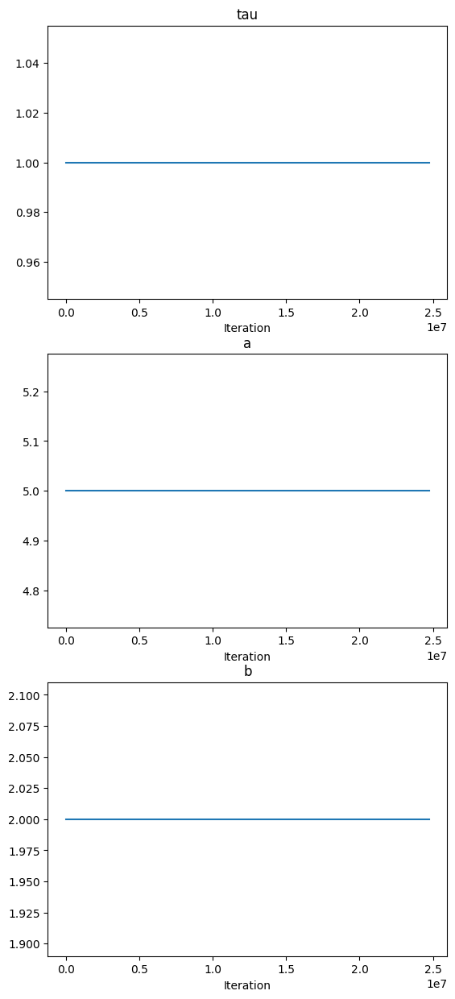

In [ ]:
curriculum = Curriculum(max_iter=int(N_EPOCHS*N_BATCHES_PER_EPOCH*BATCH_SIZE*0.5))
curriculum.add_param_list(
    [
    ("tau", curriculum.constant_scheduler(tau)),
    ("a", curriculum.constant_scheduler(a)),
    ("b", curriculum.constant_scheduler(b)),

    ]
)
curriculum.plot_all_schedules()

In [ ]:
curriculum.get_params(299*N_SAMPLES_PER_EPOCH)

{'tau': 1.0, 'a': 5.0, 'b': 2.0}

In [ ]:
data_generator = GenerateDataCurriculumCFM(
    pprogram_maker= make_lm_program_ig_batched,
    curriculum= curriculum,
)

In [ ]:
next(iter(data_generator.make_dataloaders_for_epoch_dynamic()[0])).keys()

dict_keys(['x', 'y', 'sigma_squared', 'beta', 'time', 'base_sample_beta'])

In [ ]:
"""
data_generator.check_model(
    n_samples_per_epoch=N_SAMPLES_PER_EPOCH,
    epochs_to_check = [0, N_EPOCHS-1],
    p = 5,
    used_batch_samples = 10
)
"""

'\ndata_generator.check_model(\n    n_samples_per_epoch=N_SAMPLES_PER_EPOCH,\n    epochs_to_check = [0, N_EPOCHS-1],\n    p = 5,\n    used_batch_samples = 10\n)\n'

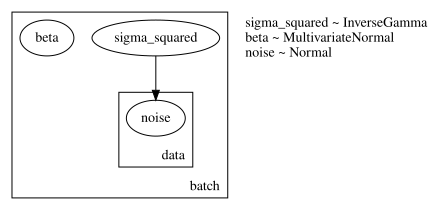

In [ ]:
data_generator.render_model()

In [ ]:
epoch_loader = data_generator.make_epoch_loader(
    n = N,
    p = P,
    number_of_batches_per_epoch = N_BATCHES_PER_EPOCH,
    n_epochs = N_EPOCHS,
    batch_size= BATCH_SIZE,
    train_frac= 0.5,
    val_frac= 0.1,
    shuffle=False,
    n_samples_to_generate_at_once = 250_000
)

The number of batches times the number of epochs must be equal to the total number of iterations in the curriculum. But got 49971200 and 24985600 respectively


In [ ]:
sample_batch = next(iter(epoch_loader[0][0]))

In [ ]:
sample_batch.keys()

dict_keys(['x', 'y', 'sigma_squared', 'beta', 'time', 'base_sample_beta'])

In [ ]:

model = TransformerCNFConditionalDecoder(
    n_input_features_encoder = P+1,
    n_input_features_decoder = P,
    d_model_encoder = 512,
    d_model_decoder = 512,
    n_heads_encoder = 8,
    n_heads_decoder = 8,
    d_ff_encoder = 1024,
    d_ff_decoder = 1024,
    dropout_encoder = 0.1,
    dropout_decoder = 0.1,
    n_conditional_input_features =  1,
    n_condition_features = 512,
    n_layers_condition_embedding = 3,
    n_layers_encoder = 8,
    n_layers_decoder = 6,
    use_positional_encoding_encoder = True,
    use_positional_encoding_decoder = False,
    use_self_attention_decoder = False,
    output_dim = P,
    d_final_processing = 512,
    n_final_layers = 3,
    dropout_final = 0.1,
    treat_z_as_sequence = False,
)

In [ ]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [ ]:
'{:.2e}'.format(count_parameters(model))

'4.31e+07'

In [ ]:
import torch
from torch.optim.lr_scheduler import ReduceLROnPlateau, OneCycleLR

In [ ]:
lr = 1e-6
opt = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=1e-5)

In [ ]:
loss_fun = CFMLossOT2(
    sigma_min=1e-2
)

In [ ]:
scheduler = OneCycleLR(opt,
                       max_lr = 5e-4,
                       epochs = N_EPOCHS,
                       steps_per_epoch = N_SAMPLES_PER_EPOCH//BATCH_SIZE,
                       pct_start = 0.1,
                       div_factor=25.0,
                       final_div_factor=1e4)

#scheduler = ReduceLROnPlateau(opt)

additional_evals = {
}

In [ ]:
#?TrainerCurriculumCNF

In [ ]:
trainer = TrainerCurriculumCNF(
    model = model,
    optimizer=opt,
    scheduler = scheduler,
    loss_function=loss_fun,
    epoch_loader = epoch_loader,
    evaluation_functions= additional_evals,
    n_epochs = N_EPOCHS,
    early_stopping_patience = 200,
    schedule_step_on = "batch",
    save_path = SAVE_PATH,
    coupling = None,
    use_same_timestep_per_batch = False,
    use_train_mode_during_validation = False,
    max_gradient_norm = 1.0

)

In [ ]:
trainer.set_new_save_path("/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM/experiment_2024_07_25_14_35_57")
trainer.save_path

'/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM/experiment_2024_07_25_14_35_57'

In [ ]:
try:
  trainer.load_best_model()
except:
  print("Could not load model")
  pass

In [ ]:
trainer.validate()

100%|██████████| 49/49 [00:21<00:00,  2.26it/s]


{'loss_mean': 2.023277997970581,
 'loss_median': 2.0268821716308594,
 'loss_std': 0.03823980316519737}

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
r = trainer.train()

Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 0


100%|██████████| 49/49 [00:21<00:00,  2.27it/s]


Epoch 0:
Training: {'loss_mean': 2.0891971588134766, 'loss_median': 2.0873944759368896, 'loss_std': 0.05533483624458313}
Validation: {'loss_mean': 1.9837493896484375, 'loss_median': 1.9807405471801758, 'loss_std': 0.03458799794316292}
Validation curriculum: {'loss_mean': 1.9835704565048218, 'loss_median': 1.982225775718689, 'loss_std': 0.0354800708591938}
Time: 369.2944085597992
Learning rate: [2.2956007119594385e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 249856


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 1:
Training: {'loss_mean': 2.0209312438964844, 'loss_median': 2.0179591178894043, 'loss_std': 0.040075190365314484}
Validation: {'loss_mean': 1.9876964092254639, 'loss_median': 1.9870918989181519, 'loss_std': 0.04214022681117058}
Validation curriculum: {'loss_mean': 1.9801156520843506, 'loss_median': 1.9806842803955078, 'loss_std': 0.040741607546806335}
Time: 369.6462736129761
Learning rate: [3.175121199428514e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 499712


100%|██████████| 49/49 [00:21<00:00,  2.26it/s]


Epoch 2:
Training: {'loss_mean': 1.997253656387329, 'loss_median': 1.9993451833724976, 'loss_std': 0.0362541563808918}
Validation: {'loss_mean': 1.970942497253418, 'loss_median': 1.9764454364776611, 'loss_std': 0.04294044151902199}
Validation curriculum: {'loss_mean': 1.980454683303833, 'loss_median': 1.9811874628067017, 'loss_std': 0.03556479886174202}
Time: 369.96632504463196
Learning rate: [4.616895888883983e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 749568


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 3:
Training: {'loss_mean': 1.979630470275879, 'loss_median': 1.9818611145019531, 'loss_std': 0.04246413707733154}
Validation: {'loss_mean': 1.920196533203125, 'loss_median': 1.920572280883789, 'loss_std': 0.04036132991313934}
Validation curriculum: {'loss_mean': 1.9293533563613892, 'loss_median': 1.9360893964767456, 'loss_std': 0.035842105746269226}
Time: 368.6176908016205
Learning rate: [6.58540897826852e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 999424


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 4:
Training: {'loss_mean': 1.7797068357467651, 'loss_median': 1.7887150049209595, 'loss_std': 0.13221889734268188}
Validation: {'loss_mean': 1.5253169536590576, 'loss_median': 1.5290197134017944, 'loss_std': 0.03212261199951172}
Validation curriculum: {'loss_mean': 1.5141931772232056, 'loss_median': 1.5157101154327393, 'loss_std': 0.03331424668431282}
Time: 366.6472399234772
Learning rate: [9.032169311688483e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 1249280


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 5:
Training: {'loss_mean': 1.13564133644104, 'loss_median': 1.0937213897705078, 'loss_std': 0.24845029413700104}
Validation: {'loss_mean': 0.8869325518608093, 'loss_median': 0.8865869641304016, 'loss_std': 0.027246151119470596}
Validation curriculum: {'loss_mean': 0.8912070989608765, 'loss_median': 0.8958659172058105, 'loss_std': 0.028360916301608086}
Time: 366.18651509284973
Learning rate: [0.0001189690488109779]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 1499136


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 6:
Training: {'loss_mean': 0.5815017223358154, 'loss_median': 0.563006579875946, 'loss_std': 0.07407449185848236}
Validation: {'loss_mean': 0.44579407572746277, 'loss_median': 0.4473922848701477, 'loss_std': 0.02041446603834629}
Validation curriculum: {'loss_mean': 0.4458395838737488, 'loss_median': 0.44225817918777466, 'loss_std': 0.018923841416835785}
Time: 365.39441084861755
Learning rate: [0.00015109047530338697]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 1748992


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 7:
Training: {'loss_mean': 0.48737138509750366, 'loss_median': 0.4866109788417816, 'loss_std': 0.023061884567141533}
Validation: {'loss_mean': 0.4877203404903412, 'loss_median': 0.48495396971702576, 'loss_std': 0.015008650720119476}
Validation curriculum: {'loss_mean': 0.4830368459224701, 'loss_median': 0.4847799241542816, 'loss_std': 0.017094461247324944}
Time: 365.2307393550873
Learning rate: [0.00018589471288241952]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 1998848


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 8:
Training: {'loss_mean': 0.4650249779224396, 'loss_median': 0.4612429738044739, 'loss_std': 0.02459600940346718}
Validation: {'loss_mean': 0.48472732305526733, 'loss_median': 0.4861384332180023, 'loss_std': 0.01782984659075737}
Validation curriculum: {'loss_mean': 0.48470231890678406, 'loss_median': 0.48405295610427856, 'loss_std': 0.018145985901355743}
Time: 365.02172589302063
Learning rate: [0.00022252441509744512]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 2248704


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 9:
Training: {'loss_mean': 0.44566959142684937, 'loss_median': 0.4426349103450775, 'loss_std': 0.021276280283927917}
Validation: {'loss_mean': 0.4216381013393402, 'loss_median': 0.4218684732913971, 'loss_std': 0.016370780766010284}
Validation curriculum: {'loss_mean': 0.41965779662132263, 'loss_median': 0.4172561764717102, 'loss_std': 0.019134212285280228}
Time: 365.22347831726074
Learning rate: [0.0002600772681106616]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 2498560


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 10:
Training: {'loss_mean': 0.44643911719322205, 'loss_median': 0.4447519779205322, 'loss_std': 0.024519186466932297}
Validation: {'loss_mean': 0.4899306893348694, 'loss_median': 0.4932246208190918, 'loss_std': 0.021161090582609177}
Validation curriculum: {'loss_mean': 0.49300751090049744, 'loss_median': 0.492800772190094, 'loss_std': 0.013697195798158646}
Time: 365.8686068058014
Learning rate: [0.0002976282177481679]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 2748416


100%|██████████| 49/49 [00:21<00:00,  2.32it/s]


Epoch 11:
Training: {'loss_mean': 0.43739333748817444, 'loss_median': 0.4341962933540344, 'loss_std': 0.026859577745199203}
Validation: {'loss_mean': 0.4068865478038788, 'loss_median': 0.40717631578445435, 'loss_std': 0.01428157277405262}
Validation curriculum: {'loss_mean': 0.4039060175418854, 'loss_median': 0.40517163276672363, 'loss_std': 0.013213030993938446}
Time: 365.2646732330322
Learning rate: [0.0003342522567226638]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 2998272


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 12:
Training: {'loss_mean': 0.429887056350708, 'loss_median': 0.42642250657081604, 'loss_std': 0.023575128987431526}
Validation: {'loss_mean': 0.4058663845062256, 'loss_median': 0.4033583700656891, 'loss_std': 0.016004981473088264}
Validation curriculum: {'loss_mean': 0.40078026056289673, 'loss_median': 0.4002647399902344, 'loss_std': 0.012602473609149456}
Time: 365.0582945346832
Learning rate: [0.0003690472107011752]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 3248128


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 13:
Training: {'loss_mean': 0.4304791986942291, 'loss_median': 0.4285140037536621, 'loss_std': 0.024219490587711334}
Validation: {'loss_mean': 0.4682740271091461, 'loss_median': 0.4683382213115692, 'loss_std': 0.018629996106028557}
Validation curriculum: {'loss_mean': 0.471502423286438, 'loss_median': 0.4738696217536926, 'loss_std': 0.016310540959239006}
Time: 364.90338158607483
Learning rate: [0.0004011559619196486]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 3497984


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 14:
Training: {'loss_mean': 0.4237559139728546, 'loss_median': 0.4226744771003723, 'loss_std': 0.01934124529361725}
Validation: {'loss_mean': 0.42296549677848816, 'loss_median': 0.42276903986930847, 'loss_std': 0.014487107284367085}
Validation curriculum: {'loss_mean': 0.4188087582588196, 'loss_median': 0.4181331694126129, 'loss_std': 0.013248741626739502}
Time: 364.62052178382874
Learning rate: [0.00042978756290139113]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 3747840


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 15:
Training: {'loss_mean': 0.42048072814941406, 'loss_median': 0.4188736379146576, 'loss_std': 0.019816625863313675}
Validation: {'loss_mean': 0.4171315133571625, 'loss_median': 0.4177286624908447, 'loss_std': 0.013947674073278904}
Validation curriculum: {'loss_mean': 0.41652199625968933, 'loss_median': 0.41616639494895935, 'loss_std': 0.01569121517241001}
Time: 364.1448402404785
Learning rate: [0.0004542367201768414]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 3997696


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 16:
Training: {'loss_mean': 0.42057478427886963, 'loss_median': 0.4183429777622223, 'loss_std': 0.021255604922771454}
Validation: {'loss_mean': 0.4251711666584015, 'loss_median': 0.42648744583129883, 'loss_std': 0.014295799657702446}
Validation curriculum: {'loss_mean': 0.42727047204971313, 'loss_median': 0.4272802472114563, 'loss_std': 0.014604644849896431}
Time: 365.098197221756
Learning rate: [0.0004739011680545465]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 4247552


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 17:
Training: {'loss_mean': 0.4149377644062042, 'loss_median': 0.4139184057712555, 'loss_std': 0.02164524234831333}
Validation: {'loss_mean': 0.4176461696624756, 'loss_median': 0.4163001477718353, 'loss_std': 0.01686624437570572}
Validation curriculum: {'loss_mean': 0.41923701763153076, 'loss_median': 0.4191509783267975, 'loss_std': 0.01359186228364706}
Time: 364.5445017814636
Learning rate: [0.0004882965044684283]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 4497408


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 18:
Training: {'loss_mean': 0.4099500775337219, 'loss_median': 0.4095935523509979, 'loss_std': 0.019077211618423462}
Validation: {'loss_mean': 0.4017377495765686, 'loss_median': 0.39840471744537354, 'loss_std': 0.013773386366665363}
Validation curriculum: {'loss_mean': 0.4008793830871582, 'loss_median': 0.4001999795436859, 'loss_std': 0.013050626963376999}
Time: 363.5423707962036
Learning rate: [0.0004970681234440837]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 4747264


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 19:
Training: {'loss_mean': 0.40423303842544556, 'loss_median': 0.40315017104148865, 'loss_std': 0.018515145406126976}
Validation: {'loss_mean': 0.4190219044685364, 'loss_median': 0.4160873591899872, 'loss_std': 0.016126694157719612}
Validation curriculum: {'loss_mean': 0.41941747069358826, 'loss_median': 0.4210887849330902, 'loss_std': 0.01581725664436817}
Time: 363.9759542942047
Learning rate: [0.000499999999360437]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 4997120


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 20:
Training: {'loss_mean': 0.39883044362068176, 'loss_median': 0.3978792130947113, 'loss_std': 0.017398390918970108}
Validation: {'loss_mean': 0.39161792397499084, 'loss_median': 0.3918273150920868, 'loss_std': 0.012762975879013538}
Validation curriculum: {'loss_mean': 0.38962769508361816, 'loss_median': 0.38895362615585327, 'loss_std': 0.01446132268756628}
Time: 363.00651502609253
Learning rate: [0.0004999616112110189]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 5246976


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 21:
Training: {'loss_mean': 0.3990462124347687, 'loss_median': 0.3976565897464752, 'loss_std': 0.017815249040722847}
Validation: {'loss_mean': 0.4002283811569214, 'loss_median': 0.39959442615509033, 'loss_std': 0.015769800171256065}
Validation curriculum: {'loss_mean': 0.40036267042160034, 'loss_median': 0.40005508065223694, 'loss_std': 0.02042996510863304}
Time: 363.9193470478058
Learning rate: [0.0004998470826380032]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 5496832


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 22:
Training: {'loss_mean': 0.39033299684524536, 'loss_median': 0.38923463225364685, 'loss_std': 0.015863921493291855}
Validation: {'loss_mean': 0.41751521825790405, 'loss_median': 0.41465774178504944, 'loss_std': 0.018791016191244125}
Validation curriculum: {'loss_mean': 0.4192369878292084, 'loss_median': 0.4186008870601654, 'loss_std': 0.017828796058893204}
Time: 364.27492904663086
Learning rate: [0.0004996564485279027]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 5746688


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 23:
Training: {'loss_mean': 0.3891546130180359, 'loss_median': 0.38903769850730896, 'loss_std': 0.017061404883861542}
Validation: {'loss_mean': 0.35335415601730347, 'loss_median': 0.3528733253479004, 'loss_std': 0.013780009932816029}
Validation curriculum: {'loss_mean': 0.3554295599460602, 'loss_median': 0.35427165031433105, 'loss_std': 0.015485753305256367}
Time: 364.24165964126587
Learning rate: [0.0004993897669497137]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 5996544


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 24:
Training: {'loss_mean': 0.3848561644554138, 'loss_median': 0.3831217885017395, 'loss_std': 0.017107974737882614}
Validation: {'loss_mean': 0.3782779574394226, 'loss_median': 0.3795493245124817, 'loss_std': 0.014766997657716274}
Validation curriculum: {'loss_mean': 0.3833383023738861, 'loss_median': 0.38039109110832214, 'loss_std': 0.01391877606511116}
Time: 363.4891085624695
Learning rate: [0.0004990471191372288]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 6246400


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 25:
Training: {'loss_mean': 0.3820193111896515, 'loss_median': 0.3810287117958069, 'loss_std': 0.015607111155986786}
Validation: {'loss_mean': 0.3918284475803375, 'loss_median': 0.39222297072410583, 'loss_std': 0.015683094039559364}
Validation curriculum: {'loss_mean': 0.3871823847293854, 'loss_median': 0.38683000206947327, 'loss_std': 0.01669292151927948}
Time: 363.3642385005951
Learning rate: [0.0004986286094642908]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 6496256


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 26:
Training: {'loss_mean': 0.3810487687587738, 'loss_median': 0.3810722827911377, 'loss_std': 0.016663597896695137}
Validation: {'loss_mean': 0.39492136240005493, 'loss_median': 0.3949452042579651, 'loss_std': 0.014866014011204243}
Validation curriculum: {'loss_mean': 0.39678385853767395, 'loss_median': 0.3981857895851135, 'loss_std': 0.014701876789331436}
Time: 363.52665519714355
Learning rate: [0.0004981343654130001]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 6746112


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 27:
Training: {'loss_mean': 0.3782120943069458, 'loss_median': 0.3781908452510834, 'loss_std': 0.01586468331515789}
Validation: {'loss_mean': 0.3875458836555481, 'loss_median': 0.388975590467453, 'loss_std': 0.01621035300195217}
Validation curriculum: {'loss_mean': 0.3869060277938843, 'loss_median': 0.38991042971611023, 'loss_std': 0.015780853107571602}
Time: 363.3423578739166
Learning rate: [0.0004975645375348827]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 6995968


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 28:
Training: {'loss_mean': 0.3787662386894226, 'loss_median': 0.377187043428421, 'loss_std': 0.017418205738067627}
Validation: {'loss_mean': 0.3787096440792084, 'loss_median': 0.3781207501888275, 'loss_std': 0.01394806057214737}
Validation curriculum: {'loss_mean': 0.38188880681991577, 'loss_median': 0.37538814544677734, 'loss_std': 0.01676887646317482}
Time: 363.7826454639435
Learning rate: [0.0004969192994050305]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 7245824


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 29:
Training: {'loss_mean': 0.3790334165096283, 'loss_median': 0.3789582848548889, 'loss_std': 0.01855769380927086}
Validation: {'loss_mean': 0.3735400140285492, 'loss_median': 0.37262681126594543, 'loss_std': 0.01590426079928875}
Validation curriculum: {'loss_mean': 0.37307608127593994, 'loss_median': 0.37230655550956726, 'loss_std': 0.013132196851074696}
Time: 363.0418882369995
Learning rate: [0.0004961988475692281]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 7495680


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 30:
Training: {'loss_mean': 0.3775060176849365, 'loss_median': 0.37665262818336487, 'loss_std': 0.017236698418855667}
Validation: {'loss_mean': 0.36044564843177795, 'loss_median': 0.35790061950683594, 'loss_std': 0.012727037072181702}
Validation curriculum: {'loss_mean': 0.35881972312927246, 'loss_median': 0.3559253215789795, 'loss_std': 0.015949534252285957}
Time: 363.18528962135315
Learning rate: [0.0004954034014840841]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 7745536


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 31:
Training: {'loss_mean': 0.37769341468811035, 'loss_median': 0.3747657239437103, 'loss_std': 0.018182935193181038}
Validation: {'loss_mean': 0.36420971155166626, 'loss_median': 0.3651995360851288, 'loss_std': 0.015496811829507351}
Validation curriculum: {'loss_mean': 0.36152780055999756, 'loss_median': 0.3616224229335785, 'loss_std': 0.014074497856199741}
Time: 363.3316686153412
Learning rate: [0.0004945332034501816]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 7995392


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 32:
Training: {'loss_mean': 0.3744061589241028, 'loss_median': 0.373216450214386, 'loss_std': 0.01667809672653675}
Validation: {'loss_mean': 0.34713292121887207, 'loss_median': 0.3457019329071045, 'loss_std': 0.011155730113387108}
Validation curriculum: {'loss_mean': 0.34780627489089966, 'loss_median': 0.3480798900127411, 'loss_std': 0.015449517406523228}
Time: 363.57024097442627
Learning rate: [0.0004935885185382714]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 8245248


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 33:
Training: {'loss_mean': 0.3740580081939697, 'loss_median': 0.37283894419670105, 'loss_std': 0.015590150840580463}
Validation: {'loss_mean': 0.37624141573905945, 'loss_median': 0.3754880428314209, 'loss_std': 0.014722541905939579}
Validation curriculum: {'loss_mean': 0.3713582456111908, 'loss_median': 0.3719940781593323, 'loss_std': 0.015817735344171524}
Time: 363.01490116119385
Learning rate: [0.0004925696345085293]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 8495104


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 34:
Training: {'loss_mean': 0.3717005252838135, 'loss_median': 0.3702952563762665, 'loss_std': 0.016830261796712875}
Validation: {'loss_mean': 0.3611830770969391, 'loss_median': 0.36150631308555603, 'loss_std': 0.013831684365868568}
Validation curriculum: {'loss_mean': 0.36485010385513306, 'loss_median': 0.365068256855011, 'loss_std': 0.016829948872327805}
Time: 364.4987018108368
Learning rate: [0.0004914768617229007]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 8744960


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 35:
Training: {'loss_mean': 0.3743284344673157, 'loss_median': 0.3734862804412842, 'loss_std': 0.01622803881764412}
Validation: {'loss_mean': 0.3531988561153412, 'loss_median': 0.3526097238063812, 'loss_std': 0.012585639953613281}
Validation curriculum: {'loss_mean': 0.3549780249595642, 'loss_median': 0.3533730208873749, 'loss_std': 0.013997012749314308}
Time: 363.20794224739075
Learning rate: [0.0004903105330505622]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 8994816


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 36:
Training: {'loss_mean': 0.37111297249794006, 'loss_median': 0.3702302873134613, 'loss_std': 0.014761490747332573}
Validation: {'loss_mean': 0.33972832560539246, 'loss_median': 0.3394677937030792, 'loss_std': 0.014732243493199348}
Validation curriculum: {'loss_mean': 0.34321922063827515, 'loss_median': 0.34242838621139526, 'loss_std': 0.012437169440090656}
Time: 363.24388790130615
Learning rate: [0.0004890710037665258]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 9244672


100%|██████████| 49/49 [00:21<00:00,  2.32it/s]


Epoch 37:
Training: {'loss_mean': 0.36829957365989685, 'loss_median': 0.3689976632595062, 'loss_std': 0.016191987320780754}
Validation: {'loss_mean': 0.35504990816116333, 'loss_median': 0.35334405303001404, 'loss_std': 0.012232484295964241}
Validation curriculum: {'loss_mean': 0.35174787044525146, 'loss_median': 0.3493354320526123, 'loss_std': 0.014203461818397045}
Time: 362.7438066005707
Learning rate: [0.0004877586514434188]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 9494528


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 38:
Training: {'loss_mean': 0.3707226812839508, 'loss_median': 0.3691089451313019, 'loss_std': 0.015598076395690441}
Validation: {'loss_mean': 0.3668753206729889, 'loss_median': 0.3686175048351288, 'loss_std': 0.016402224078774452}
Validation curriculum: {'loss_mean': 0.3601834177970886, 'loss_median': 0.36216920614242554, 'loss_std': 0.013783992268145084}
Time: 363.01947569847107
Learning rate: [0.00048637387583647215]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 9744384


100%|██████████| 49/49 [00:21<00:00,  2.32it/s]


Epoch 39:
Training: {'loss_mean': 0.36998993158340454, 'loss_median': 0.36803990602493286, 'loss_std': 0.01654917001724243}
Validation: {'loss_mean': 0.33857065439224243, 'loss_median': 0.34081679582595825, 'loss_std': 0.01154347788542509}
Validation curriculum: {'loss_mean': 0.3425123989582062, 'loss_median': 0.3453593850135803, 'loss_std': 0.013215363956987858}
Time: 363.20589780807495
Learning rate: [0.0004849170987617503]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 9994240


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 40:
Training: {'loss_mean': 0.36824750900268555, 'loss_median': 0.3672029972076416, 'loss_std': 0.01663391664624214}
Validation: {'loss_mean': 0.36716604232788086, 'loss_median': 0.36916837096214294, 'loss_std': 0.015018349513411522}
Validation curriculum: {'loss_mean': 0.3657722473144531, 'loss_median': 0.3637227714061737, 'loss_std': 0.016160020604729652}
Time: 364.5235404968262
Learning rate: [0.00048338876396766226]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 10244096


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 41:
Training: {'loss_mean': 0.3672374486923218, 'loss_median': 0.3663836419582367, 'loss_std': 0.015792030841112137}
Validation: {'loss_mean': 0.36131924390792847, 'loss_median': 0.36362871527671814, 'loss_std': 0.017755024135112762}
Validation curriculum: {'loss_mean': 0.36217767000198364, 'loss_median': 0.3624628484249115, 'loss_std': 0.0135493203997612}
Time: 363.8250765800476
Learning rate: [0.00048178933699979156]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 10493952


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 42:
Training: {'loss_mean': 0.3672832250595093, 'loss_median': 0.36660733819007874, 'loss_std': 0.01623578369617462}
Validation: {'loss_mean': 0.33954140543937683, 'loss_median': 0.3415665328502655, 'loss_std': 0.01476084254682064}
Validation curriculum: {'loss_mean': 0.3483009338378906, 'loss_median': 0.34785938262939453, 'loss_std': 0.012798256240785122}
Time: 363.0215268135071
Learning rate: [0.00048011930505908676]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 10743808


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 43:
Training: {'loss_mean': 0.3664058744907379, 'loss_median': 0.36600610613822937, 'loss_std': 0.014951333403587341}
Validation: {'loss_mean': 0.3386985957622528, 'loss_median': 0.3387741446495056, 'loss_std': 0.013840931467711926}
Validation curriculum: {'loss_mean': 0.34067749977111816, 'loss_median': 0.3418597877025604, 'loss_std': 0.0111331045627594}
Time: 362.5218367576599
Learning rate: [0.00047837917685345486]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 10993664


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 44:
Training: {'loss_mean': 0.36620286107063293, 'loss_median': 0.3646313548088074, 'loss_std': 0.01666613295674324}
Validation: {'loss_mean': 0.3654308617115021, 'loss_median': 0.36496680974960327, 'loss_std': 0.01591157168149948}
Validation curriculum: {'loss_mean': 0.36180737614631653, 'loss_median': 0.3636378347873688, 'loss_std': 0.01372010912746191}
Time: 362.3635630607605
Learning rate: [0.00047656948244280433]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 11243520


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 45:
Training: {'loss_mean': 0.36671510338783264, 'loss_median': 0.3657982051372528, 'loss_std': 0.017411543056368828}
Validation: {'loss_mean': 0.35932931303977966, 'loss_median': 0.35894718766212463, 'loss_std': 0.01597929559648037}
Validation curriculum: {'loss_mean': 0.3565984070301056, 'loss_median': 0.3567354679107666, 'loss_std': 0.012587904930114746}
Time: 362.8208930492401
Learning rate: [0.0004746907730775835]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 11493376


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 46:
Training: {'loss_mean': 0.3641026020050049, 'loss_median': 0.3646932542324066, 'loss_std': 0.015927612781524658}
Validation: {'loss_mean': 0.3542744517326355, 'loss_median': 0.3548789620399475, 'loss_std': 0.012002617120742798}
Validation curriculum: {'loss_mean': 0.35124334692955017, 'loss_median': 0.3508119285106659, 'loss_std': 0.014052891172468662}
Time: 363.12636709213257
Learning rate: [0.00047274362103086456]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 11743232


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 47:
Training: {'loss_mean': 0.36486801505088806, 'loss_median': 0.3634110391139984, 'loss_std': 0.015666738152503967}
Validation: {'loss_mean': 0.3520342707633972, 'loss_median': 0.35306188464164734, 'loss_std': 0.015619506128132343}
Validation curriculum: {'loss_mean': 0.3529845178127289, 'loss_median': 0.3526495099067688, 'loss_std': 0.014279705472290516}
Time: 363.18224239349365
Learning rate: [0.0004707286194240234]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 11993088


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 48:
Training: {'loss_mean': 0.36631378531455994, 'loss_median': 0.3637472987174988, 'loss_std': 0.017651928588747978}
Validation: {'loss_mean': 0.34993794560432434, 'loss_median': 0.35112690925598145, 'loss_std': 0.01189889945089817}
Validation curriculum: {'loss_mean': 0.34286344051361084, 'loss_median': 0.34369945526123047, 'loss_std': 0.01486088428646326}
Time: 362.5602343082428
Learning rate: [0.0004686463820460693]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 12242944


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 49:
Training: {'loss_mean': 0.3639930784702301, 'loss_median': 0.36272794008255005, 'loss_std': 0.014606662094593048}
Validation: {'loss_mean': 0.3413785696029663, 'loss_median': 0.34098631143569946, 'loss_std': 0.01604042388498783}
Validation curriculum: {'loss_mean': 0.34011536836624146, 'loss_median': 0.3407796025276184, 'loss_std': 0.015817100182175636}
Time: 363.4839594364166
Learning rate: [0.0004664975431666784]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 12492800


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 50:
Training: {'loss_mean': 0.3650519847869873, 'loss_median': 0.36477288603782654, 'loss_std': 0.01570163667201996}
Validation: {'loss_mean': 0.3512272834777832, 'loss_median': 0.35205140709877014, 'loss_std': 0.014455041848123074}
Validation curriculum: {'loss_mean': 0.3450898230075836, 'loss_median': 0.34220167994499207, 'loss_std': 0.01590215228497982}
Time: 362.8928425312042
Learning rate: [0.00046428275734298997]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 12742656


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 51:
Training: {'loss_mean': 0.3637666404247284, 'loss_median': 0.36327311396598816, 'loss_std': 0.015009008347988129}
Validation: {'loss_mean': 0.34837910532951355, 'loss_median': 0.34913724660873413, 'loss_std': 0.01302491407841444}
Validation curriculum: {'loss_mean': 0.34787485003471375, 'loss_median': 0.349809855222702, 'loss_std': 0.013880436308681965}
Time: 362.8811411857605
Learning rate: [0.0004620026992202209]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 12992512


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 52:
Training: {'loss_mean': 0.36354631185531616, 'loss_median': 0.3632051944732666, 'loss_std': 0.016264580190181732}
Validation: {'loss_mean': 0.34963008761405945, 'loss_median': 0.35114651918411255, 'loss_std': 0.01567898690700531}
Validation curriculum: {'loss_mean': 0.34878528118133545, 'loss_median': 0.3495502173900604, 'loss_std': 0.014460606500506401}
Time: 363.10397148132324
Learning rate: [0.00045965806332616267]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 13242368


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 53:
Training: {'loss_mean': 0.36227625608444214, 'loss_median': 0.3624434471130371, 'loss_std': 0.01526490319520235}
Validation: {'loss_mean': 0.35172897577285767, 'loss_median': 0.3502589762210846, 'loss_std': 0.014999610371887684}
Validation curriculum: {'loss_mean': 0.3510899543762207, 'loss_median': 0.3515065610408783, 'loss_std': 0.014464753679931164}
Time: 363.1653437614441
Learning rate: [0.00045724956385962177]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 13492224


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 54:
Training: {'loss_mean': 0.36536112427711487, 'loss_median': 0.36416515707969666, 'loss_std': 0.016554782167077065}
Validation: {'loss_mean': 0.3521018624305725, 'loss_median': 0.35106468200683594, 'loss_std': 0.01495079044252634}
Validation curriculum: {'loss_mean': 0.35647884011268616, 'loss_median': 0.356738805770874, 'loss_std': 0.014085756614804268}
Time: 362.74320459365845
Learning rate: [0.00045477793447286737]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 13742080


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 55:
Training: {'loss_mean': 0.3628453314304352, 'loss_median': 0.36272701621055603, 'loss_std': 0.01431991159915924}
Validation: {'loss_mean': 0.33617550134658813, 'loss_median': 0.33610865473747253, 'loss_std': 0.015391718596220016}
Validation curriculum: {'loss_mean': 0.33357930183410645, 'loss_median': 0.33266934752464294, 'loss_std': 0.012652875855565071}
Time: 362.321932554245
Learning rate: [0.0004522439280481537]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 13991936


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 56:
Training: {'loss_mean': 0.3605071008205414, 'loss_median': 0.360565721988678, 'loss_std': 0.014983052387833595}
Validation: {'loss_mean': 0.34514349699020386, 'loss_median': 0.3433569073677063, 'loss_std': 0.015116112306714058}
Validation curriculum: {'loss_mean': 0.34943389892578125, 'loss_median': 0.3507309556007385, 'loss_std': 0.016896450892090797}
Time: 362.2470123767853
Learning rate: [0.0004496483164683854]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 14241792


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 57:
Training: {'loss_mean': 0.3611379861831665, 'loss_median': 0.36027956008911133, 'loss_std': 0.014749239198863506}
Validation: {'loss_mean': 0.3374848961830139, 'loss_median': 0.33627015352249146, 'loss_std': 0.013016750104725361}
Validation curriculum: {'loss_mean': 0.3393716514110565, 'loss_median': 0.340084046125412, 'loss_std': 0.01602858491241932}
Time: 361.95455956459045
Learning rate: [0.0004469918903819938]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 14491648


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 58:
Training: {'loss_mean': 0.3612062931060791, 'loss_median': 0.361145943403244, 'loss_std': 0.015120139345526695}
Validation: {'loss_mean': 0.3472360372543335, 'loss_median': 0.34665486216545105, 'loss_std': 0.014848725870251656}
Validation curriculum: {'loss_mean': 0.34550896286964417, 'loss_median': 0.3459412157535553, 'loss_std': 0.013919169083237648}
Time: 362.7946665287018
Learning rate: [0.00044427545896209825]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 14741504


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 59:
Training: {'loss_mean': 0.3597240746021271, 'loss_median': 0.3583836257457733, 'loss_std': 0.016049496829509735}
Validation: {'loss_mean': 0.3564845621585846, 'loss_median': 0.35324031114578247, 'loss_std': 0.013952773995697498}
Validation curriculum: {'loss_mean': 0.35794156789779663, 'loss_median': 0.3586598038673401, 'loss_std': 0.012795081362128258}
Time: 362.84326815605164
Learning rate: [0.00044149984966002396]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 14991360


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 60:
Training: {'loss_mean': 0.36142516136169434, 'loss_median': 0.3601500391960144, 'loss_std': 0.015648463740944862}
Validation: {'loss_mean': 0.348067045211792, 'loss_median': 0.3466647267341614, 'loss_std': 0.0155188562348485}
Validation curriculum: {'loss_mean': 0.34991446137428284, 'loss_median': 0.349297434091568, 'loss_std': 0.01589212752878666}
Time: 362.16173553466797
Learning rate: [0.00043866590795325216]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 15241216


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 61:
Training: {'loss_mean': 0.35978254675865173, 'loss_median': 0.35980185866355896, 'loss_std': 0.015167942270636559}
Validation: {'loss_mean': 0.34457024931907654, 'loss_median': 0.34497910737991333, 'loss_std': 0.014906689524650574}
Validation curriculum: {'loss_mean': 0.3496341407299042, 'loss_median': 0.3495604693889618, 'loss_std': 0.016047218814492226}
Time: 361.94050312042236
Learning rate: [0.0004357744970878798]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 15491072


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 62:
Training: {'loss_mean': 0.3599926233291626, 'loss_median': 0.3599749505519867, 'loss_std': 0.014358659274876118}
Validation: {'loss_mean': 0.34207937121391296, 'loss_median': 0.3419666886329651, 'loss_std': 0.012505660764873028}
Validation curriculum: {'loss_mean': 0.3441702425479889, 'loss_median': 0.3440791070461273, 'loss_std': 0.011012769304215908}
Time: 362.0843286514282
Learning rate: [0.00043282649781566627]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 15740928


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 63:
Training: {'loss_mean': 0.35854941606521606, 'loss_median': 0.35829004645347595, 'loss_std': 0.01532741542905569}
Validation: {'loss_mean': 0.36816340684890747, 'loss_median': 0.36851465702056885, 'loss_std': 0.01599479466676712}
Validation curriculum: {'loss_mean': 0.370462030172348, 'loss_median': 0.36958742141723633, 'loss_std': 0.013412753120064735}
Time: 361.8847815990448
Learning rate: [0.0004298228081257476]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 15990784


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 64:
Training: {'loss_mean': 0.3591233193874359, 'loss_median': 0.3583618700504303, 'loss_std': 0.014526546001434326}
Validation: {'loss_mean': 0.3430093228816986, 'loss_median': 0.34199920296669006, 'loss_std': 0.01422097533941269}
Validation curriculum: {'loss_mean': 0.3418008089065552, 'loss_median': 0.3418641984462738, 'loss_std': 0.013105678372085094}
Time: 362.70160460472107
Learning rate: [0.00042676434297110095]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 16240640


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 65:
Training: {'loss_mean': 0.3576865792274475, 'loss_median': 0.3561386168003082, 'loss_std': 0.015141701325774193}
Validation: {'loss_mean': 0.35485127568244934, 'loss_median': 0.3564949631690979, 'loss_std': 0.015240202657878399}
Validation curriculum: {'loss_mean': 0.3537251949310303, 'loss_median': 0.3532777726650238, 'loss_std': 0.015714850276708603}
Time: 362.6052145957947
Learning rate: [0.00042365203398984035]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 16490496


100%|██████████| 49/49 [00:21<00:00,  2.32it/s]


Epoch 66:
Training: {'loss_mean': 0.35568520426750183, 'loss_median': 0.35551485419273376, 'loss_std': 0.015430259518325329}
Validation: {'loss_mean': 0.3449897766113281, 'loss_median': 0.3425593376159668, 'loss_std': 0.013950538821518421}
Validation curriculum: {'loss_mean': 0.3480037450790405, 'loss_median': 0.3480242192745209, 'loss_std': 0.014646895229816437}
Time: 361.90340876579285
Learning rate: [0.000420486829221431]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 16740352


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 67:
Training: {'loss_mean': 0.3550441563129425, 'loss_median': 0.355053186416626, 'loss_std': 0.013916371390223503}
Validation: {'loss_mean': 0.34664788842201233, 'loss_median': 0.3454672396183014, 'loss_std': 0.014298131689429283}
Validation curriculum: {'loss_mean': 0.34520718455314636, 'loss_median': 0.34430819749832153, 'loss_std': 0.01304429117590189}
Time: 361.68497467041016
Learning rate: [0.0004172696928179076]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 16990208


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 68:
Training: {'loss_mean': 0.3539355397224426, 'loss_median': 0.3538522720336914, 'loss_std': 0.014938290230929852}
Validation: {'loss_mean': 0.33917728066444397, 'loss_median': 0.3392179608345032, 'loss_std': 0.015389323234558105}
Validation curriculum: {'loss_mean': 0.338000625371933, 'loss_median': 0.3371109962463379, 'loss_std': 0.012887159362435341}
Time: 361.6578052043915
Learning rate: [0.0004140016047501836]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 17240064


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 69:
Training: {'loss_mean': 0.3552781641483307, 'loss_median': 0.3557931184768677, 'loss_std': 0.015663299709558487}
Validation: {'loss_mean': 0.3448955714702606, 'loss_median': 0.34477004408836365, 'loss_std': 0.010855140164494514}
Validation curriculum: {'loss_mean': 0.34331652522087097, 'loss_median': 0.3456340730190277, 'loss_std': 0.011241489090025425}
Time: 361.56999945640564
Learning rate: [0.0004106835605095432]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 17489920


100%|██████████| 49/49 [00:21<00:00,  2.30it/s]


Epoch 70:
Training: {'loss_mean': 0.35487791895866394, 'loss_median': 0.3559177815914154, 'loss_std': 0.015667453408241272}
Validation: {'loss_mean': 0.349785715341568, 'loss_median': 0.34963104128837585, 'loss_std': 0.012866614386439323}
Validation curriculum: {'loss_mean': 0.34900447726249695, 'loss_median': 0.34847378730773926, 'loss_std': 0.01266723033040762}
Time: 362.318083524704
Learning rate: [0.0004073165708044047]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 17739776


100%|██████████| 49/49 [00:21<00:00,  2.32it/s]


Epoch 71:
Training: {'loss_mean': 0.354218989610672, 'loss_median': 0.35413771867752075, 'loss_std': 0.015581045299768448}
Validation: {'loss_mean': 0.33219900727272034, 'loss_median': 0.33402252197265625, 'loss_std': 0.011775923892855644}
Validation curriculum: {'loss_mean': 0.3311587870121002, 'loss_median': 0.33256322145462036, 'loss_std': 0.015411637723445892}
Time: 362.2280671596527
Learning rate: [0.0004039016612524489]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 17989632


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 72:
Training: {'loss_mean': 0.3568436801433563, 'loss_median': 0.3556901812553406, 'loss_std': 0.015551527962088585}
Validation: {'loss_mean': 0.33164098858833313, 'loss_median': 0.3329468369483948, 'loss_std': 0.011692473664879799}
Validation curriculum: {'loss_mean': 0.331707626581192, 'loss_median': 0.3313654363155365, 'loss_std': 0.013323018327355385}
Time: 361.8687779903412
Learning rate: [0.00040043987206820654]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 18239488


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 73:
Training: {'loss_mean': 0.3539557158946991, 'loss_median': 0.35372868180274963, 'loss_std': 0.016429046168923378}
Validation: {'loss_mean': 0.35245755314826965, 'loss_median': 0.35232195258140564, 'loss_std': 0.014225175604224205}
Validation curriculum: {'loss_mean': 0.35317158699035645, 'loss_median': 0.35116204619407654, 'loss_std': 0.015808437019586563}
Time: 361.9256317615509
Learning rate: [0.0003969322577461981]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 18489344


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 74:
Training: {'loss_mean': 0.3552101254463196, 'loss_median': 0.3545273244380951, 'loss_std': 0.016952650621533394}
Validation: {'loss_mean': 0.33544886112213135, 'loss_median': 0.33817940950393677, 'loss_std': 0.014553428627550602}
Validation curriculum: {'loss_mean': 0.33832094073295593, 'loss_median': 0.3363058269023895, 'loss_std': 0.014499953016638756}
Time: 361.7779190540314
Learning rate: [0.00039337988673972507]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 18739200


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 75:
Training: {'loss_mean': 0.3523959815502167, 'loss_median': 0.3508472144603729, 'loss_std': 0.01689198799431324}
Validation: {'loss_mean': 0.3406713008880615, 'loss_median': 0.33866024017333984, 'loss_std': 0.017758596688508987}
Validation curriculum: {'loss_mean': 0.3418899178504944, 'loss_median': 0.3428010046482086, 'loss_std': 0.014791806228458881}
Time: 361.9089365005493
Learning rate: [0.0003897838411354087]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 18989056


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 76:
Training: {'loss_mean': 0.35340791940689087, 'loss_median': 0.3528019189834595, 'loss_std': 0.013241320848464966}
Validation: {'loss_mean': 0.33488786220550537, 'loss_median': 0.33328983187675476, 'loss_std': 0.015492712147533894}
Validation curriculum: {'loss_mean': 0.3318009376525879, 'loss_median': 0.32943257689476013, 'loss_std': 0.01403145119547844}
Time: 362.123797416687
Learning rate: [0.0003861452163235757]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 19238912


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 77:
Training: {'loss_mean': 0.3522730767726898, 'loss_median': 0.35059526562690735, 'loss_std': 0.015884635969996452}
Validation: {'loss_mean': 0.33193591237068176, 'loss_median': 0.33191415667533875, 'loss_std': 0.014287014491856098}
Validation curriculum: {'loss_mean': 0.33018994331359863, 'loss_median': 0.3318806290626526, 'loss_std': 0.011487535201013088}
Time: 362.3894147872925
Learning rate: [0.0003824651206645919]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 19488768


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 78:
Training: {'loss_mean': 0.3515194058418274, 'loss_median': 0.35185885429382324, 'loss_std': 0.014284979552030563}
Validation: {'loss_mean': 0.33212602138519287, 'loss_median': 0.33121952414512634, 'loss_std': 0.014088703319430351}
Validation curriculum: {'loss_mean': 0.334194153547287, 'loss_median': 0.3322194218635559, 'loss_std': 0.011286075226962566}
Time: 361.9792003631592
Learning rate: [0.0003787446751512449]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 19738624


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 79:
Training: {'loss_mean': 0.35252487659454346, 'loss_median': 0.3518337607383728, 'loss_std': 0.015325347892940044}
Validation: {'loss_mean': 0.33490774035453796, 'loss_median': 0.33584141731262207, 'loss_std': 0.015994854271411896}
Validation curriculum: {'loss_mean': 0.33619844913482666, 'loss_median': 0.33626502752304077, 'loss_std': 0.014366556890308857}
Time: 361.4668393135071
Learning rate: [0.0003749850130672788]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 19988480


100%|██████████| 49/49 [00:21<00:00,  2.32it/s]


Epoch 80:
Training: {'loss_mean': 0.35162806510925293, 'loss_median': 0.35120055079460144, 'loss_std': 0.01588142104446888}
Validation: {'loss_mean': 0.339997261762619, 'loss_median': 0.33926138281822205, 'loss_std': 0.011741613037884235}
Validation curriculum: {'loss_mean': 0.3386523723602295, 'loss_median': 0.3392755091190338, 'loss_std': 0.01387285441160202}
Time: 361.40400648117065
Learning rate: [0.00037118727964218515]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 20238336


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 81:
Training: {'loss_mean': 0.35344603657722473, 'loss_median': 0.3525780737400055, 'loss_std': 0.015105861239135265}
Validation: {'loss_mean': 0.3501974940299988, 'loss_median': 0.3504171073436737, 'loss_std': 0.014824717305600643}
Validation curriculum: {'loss_mean': 0.3536042869091034, 'loss_median': 0.3544984757900238, 'loss_std': 0.012806649319827557}
Time: 361.6225838661194
Learning rate: [0.00036735263170235464]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 20488192


100%|██████████| 49/49 [00:21<00:00,  2.32it/s]


Epoch 82:
Training: {'loss_mean': 0.3528403341770172, 'loss_median': 0.35353884100914, 'loss_std': 0.013939909636974335}
Validation: {'loss_mean': 0.33840277791023254, 'loss_median': 0.3354492783546448, 'loss_std': 0.013935469090938568}
Validation curriculum: {'loss_mean': 0.34124332666397095, 'loss_median': 0.33746758103370667, 'loss_std': 0.015149327926337719}
Time: 361.94538974761963
Learning rate: [0.0003634822373186968]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 20738048


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 83:
Training: {'loss_mean': 0.3523196876049042, 'loss_median': 0.35135072469711304, 'loss_std': 0.015096791088581085}
Validation: {'loss_mean': 0.3442952036857605, 'loss_median': 0.34211188554763794, 'loss_std': 0.015350929461419582}
Validation curriculum: {'loss_mean': 0.34146398305892944, 'loss_median': 0.34119364619255066, 'loss_std': 0.014129426330327988}
Time: 362.2179026603699
Learning rate: [0.0003595772754508342]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 20987904


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 84:
Training: {'loss_mean': 0.3511376976966858, 'loss_median': 0.3507588505744934, 'loss_std': 0.014292283914983273}
Validation: {'loss_mean': 0.348190039396286, 'loss_median': 0.3489293158054352, 'loss_std': 0.015256655402481556}
Validation curriculum: {'loss_mean': 0.34665602445602417, 'loss_median': 0.3465496003627777, 'loss_std': 0.01896517537534237}
Time: 361.3490078449249
Learning rate: [0.0003556389355879801]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 21237760


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 85:
Training: {'loss_mean': 0.350690633058548, 'loss_median': 0.34970995783805847, 'loss_std': 0.014494824223220348}
Validation: {'loss_mean': 0.3355691730976105, 'loss_median': 0.3339146077632904, 'loss_std': 0.014345099218189716}
Validation curriculum: {'loss_mean': 0.33901217579841614, 'loss_median': 0.33970189094543457, 'loss_std': 0.015180203132331371}
Time: 361.101989030838
Learning rate: [0.00035166841738660826]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 21487616


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 86:
Training: {'loss_mean': 0.3517060875892639, 'loss_median': 0.3506507873535156, 'loss_std': 0.014931525103747845}
Validation: {'loss_mean': 0.3362291157245636, 'loss_median': 0.3361871838569641, 'loss_std': 0.01254906877875328}
Validation curriculum: {'loss_mean': 0.33510810136795044, 'loss_median': 0.335976779460907, 'loss_std': 0.011764097027480602}
Time: 361.52376341819763
Learning rate: [0.00034766693030502605]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 21737472


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 87:
Training: {'loss_mean': 0.35030776262283325, 'loss_median': 0.34962692856788635, 'loss_std': 0.015089994296431541}
Validation: {'loss_mean': 0.3428361117839813, 'loss_median': 0.3427010476589203, 'loss_std': 0.012452315539121628}
Validation curriculum: {'loss_mean': 0.3434690237045288, 'loss_median': 0.3438887596130371, 'loss_std': 0.013221079483628273}
Time: 361.3240602016449
Learning rate: [0.00034363569323496185]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 21987328


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 88:
Training: {'loss_mean': 0.34956541657447815, 'loss_median': 0.34975728392601013, 'loss_std': 0.014999681152403355}
Validation: {'loss_mean': 0.33326056599617004, 'loss_median': 0.3308243155479431, 'loss_std': 0.016459420323371887}
Validation curriculum: {'loss_mean': 0.3374118506908417, 'loss_median': 0.3369857370853424, 'loss_std': 0.015334651805460453}
Time: 361.9195261001587
Learning rate: [0.0003395759341302786]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 22237184


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 89:
Training: {'loss_mean': 0.3507736027240753, 'loss_median': 0.3498615324497223, 'loss_std': 0.01533014141023159}
Validation: {'loss_mean': 0.32601016759872437, 'loss_median': 0.32495057582855225, 'loss_std': 0.014297284185886383}
Validation curriculum: {'loss_mean': 0.3306928277015686, 'loss_median': 0.3298531472682953, 'loss_std': 0.01448538526892662}
Time: 361.86253094673157
Learning rate: [0.00033548888963292744]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 22487040


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 90:
Training: {'loss_mean': 0.35206139087677, 'loss_median': 0.3528900146484375, 'loss_std': 0.014138855040073395}
Validation: {'loss_mean': 0.3284008204936981, 'loss_median': 0.3261382281780243, 'loss_std': 0.012297595851123333}
Validation curriculum: {'loss_mean': 0.33172228932380676, 'loss_median': 0.3327740728855133, 'loss_std': 0.015917092561721802}
Time: 361.24378991127014
Learning rate: [0.0003313758046962543]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 22736896


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 91:
Training: {'loss_mean': 0.3491480350494385, 'loss_median': 0.3489067256450653, 'loss_std': 0.014727496542036533}
Validation: {'loss_mean': 0.3323906362056732, 'loss_median': 0.333020955324173, 'loss_std': 0.014618556015193462}
Validation curriculum: {'loss_mean': 0.3345043361186981, 'loss_median': 0.33058497309684753, 'loss_std': 0.0141421714797616}
Time: 361.5440924167633
Learning rate: [0.00032723793220577516]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 22986752


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 92:
Training: {'loss_mean': 0.3492076098918915, 'loss_median': 0.3495394289493561, 'loss_std': 0.013670749962329865}
Validation: {'loss_mean': 0.3301965892314911, 'loss_median': 0.3313960134983063, 'loss_std': 0.012459355406463146}
Validation curriculum: {'loss_mean': 0.3308638036251068, 'loss_median': 0.33156657218933105, 'loss_std': 0.014058216474950314}
Time: 361.1983263492584
Learning rate: [0.0003230765325975353]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 23236608


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 93:
Training: {'loss_mean': 0.35006287693977356, 'loss_median': 0.3504122793674469, 'loss_std': 0.014717921614646912}
Validation: {'loss_mean': 0.341200590133667, 'loss_median': 0.34157732129096985, 'loss_std': 0.014609547331929207}
Validation curriculum: {'loss_mean': 0.3381730020046234, 'loss_median': 0.338861346244812, 'loss_std': 0.014296850189566612}
Time: 361.3281078338623
Learning rate: [0.00031889287347416754]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 23486464


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 94:
Training: {'loss_mean': 0.3483929932117462, 'loss_median': 0.348458856344223, 'loss_std': 0.014181985519826412}
Validation: {'loss_mean': 0.3349640369415283, 'loss_median': 0.33578893542289734, 'loss_std': 0.012081635184586048}
Validation curriculum: {'loss_mean': 0.33710628747940063, 'loss_median': 0.3381677567958832, 'loss_std': 0.015079457312822342}
Time: 361.7599289417267
Learning rate: [0.000314688229218769]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 23736320


100%|██████████| 49/49 [00:21<00:00,  2.32it/s]


Epoch 95:
Training: {'loss_mean': 0.350027859210968, 'loss_median': 0.3496340215206146, 'loss_std': 0.014224108308553696}
Validation: {'loss_mean': 0.3396078646183014, 'loss_median': 0.33781442046165466, 'loss_std': 0.013257088139653206}
Validation curriculum: {'loss_mean': 0.34116214513778687, 'loss_median': 0.3415919244289398, 'loss_std': 0.013841506093740463}
Time: 361.857745885849
Learning rate: [0.0003104638806067112]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 23986176


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 96:
Training: {'loss_mean': 0.34854865074157715, 'loss_median': 0.34849226474761963, 'loss_std': 0.014562094584107399}
Validation: {'loss_mean': 0.34381675720214844, 'loss_median': 0.34299468994140625, 'loss_std': 0.01452588476240635}
Validation curriculum: {'loss_mean': 0.3425482511520386, 'loss_median': 0.34024694561958313, 'loss_std': 0.01480442937463522}
Time: 361.5675194263458
Learning rate: [0.0003062211144155036]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 24236032


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 97:
Training: {'loss_mean': 0.3477286994457245, 'loss_median': 0.34757474064826965, 'loss_std': 0.014361907728016376}
Validation: {'loss_mean': 0.3387295603752136, 'loss_median': 0.338370144367218, 'loss_std': 0.01609065569937229}
Validation curriculum: {'loss_mean': 0.33419203758239746, 'loss_median': 0.33431991934776306, 'loss_std': 0.014941958710551262}
Time: 361.42547702789307
Learning rate: [0.00030196122303282843]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 24485888


100%|██████████| 49/49 [00:21<00:00,  2.32it/s]


Epoch 98:
Training: {'loss_mean': 0.3485937714576721, 'loss_median': 0.3483227789402008, 'loss_std': 0.014236859045922756}
Validation: {'loss_mean': 0.33294859528541565, 'loss_median': 0.33225390315055847, 'loss_std': 0.014526584185659885}
Validation curriculum: {'loss_mean': 0.33273667097091675, 'loss_median': 0.33308491110801697, 'loss_std': 0.012028255499899387}
Time: 360.9405252933502
Learning rate: [0.00029768550406286757]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 24735744


100%|██████████| 49/49 [00:21<00:00,  2.30it/s]


Epoch 99:
Training: {'loss_mean': 0.3493657112121582, 'loss_median': 0.34789830446243286, 'loss_std': 0.013731886632740498}
Validation: {'loss_mean': 0.3342513144016266, 'loss_median': 0.3326800763607025, 'loss_std': 0.012496966868638992}
Validation curriculum: {'loss_mean': 0.3319804072380066, 'loss_median': 0.3302886486053467, 'loss_std': 0.013130543753504753}
Time: 361.4795591831207
Learning rate: [0.0002933952599310389]


----------------------------------------------------------------------------------------------------


100%|██████████| 196/196 [01:23<00:00,  2.35it/s]

Test: {'loss_mean': 0.3300844430923462, 'loss_median': 0.33051595091819763, 'loss_std': 0.01369655504822731}


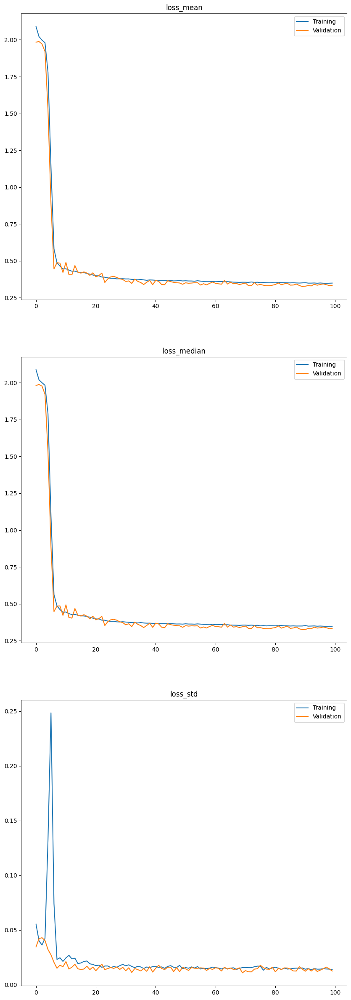

In [ ]:
visualize_training_results(r, loglog = False)

In [ ]:
trainer.load_best_model()

In [ ]:
model = trainer.model

In [ ]:
model.eval()

TransformerCNFConditionalDecoder(
  (condition_embedding_layer): MLP(
    (linear1): Linear_block(
      (fc): Linear(in_features=1, out_features=512, bias=True)
      (act): LeakyReLU(negative_slope=0.01)
      (bn): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (drop): Dropout(p=0.1, inplace=False)
    )
    (hidden_layers): Sequential(
      (0): Linear_skip_block(
        (fc): Linear(in_features=512, out_features=512, bias=True)
        (act): LeakyReLU(negative_slope=0.01)
        (bn): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (drop): Dropout(p=0.1, inplace=False)
      )
      (1): Linear_skip_block(
        (fc): Linear(in_features=512, out_features=512, bias=True)
        (act): LeakyReLU(negative_slope=0.01)
        (bn): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (drop): Dropout(p=0.1, inplace=False)
      )
      (2): Linear_skip_block(
    

In [ ]:
trainer.load_best_model()

In [ ]:
trainer.model.cuda()

TransformerCNFConditionalDecoder(
  (condition_embedding_layer): MLP(
    (linear1): Linear_block(
      (fc): Linear(in_features=1, out_features=512, bias=True)
      (act): LeakyReLU(negative_slope=0.01)
      (bn): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (drop): Dropout(p=0.1, inplace=False)
    )
    (hidden_layers): Sequential(
      (0): Linear_skip_block(
        (fc): Linear(in_features=512, out_features=512, bias=True)
        (act): LeakyReLU(negative_slope=0.01)
        (bn): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (drop): Dropout(p=0.1, inplace=False)
      )
      (1): Linear_skip_block(
        (fc): Linear(in_features=512, out_features=512, bias=True)
        (act): LeakyReLU(negative_slope=0.01)
        (bn): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (drop): Dropout(p=0.1, inplace=False)
      )
      (2): Linear_skip_block(
    

In [ ]:
trainer.test()

100%|██████████| 196/196 [01:22<00:00,  2.38it/s]


{'loss_mean': 0.33548980951309204,
 'loss_median': 0.3352174758911133,
 'loss_std': 0.014562331140041351}

In [ ]:
N_SAMPLES_PER_MODEL = 1_000

In [ ]:
full_model = ModelToPosteriorCNF(
    model = model.eval(),
    sample_name = "beta",
    sample_shape = (P,),
    n_samples=1000,
    batch_size = BATCH_SIZE,
    solve_adjoint = True,
    atol = 1e-7,
    rtol = 1e-7,
    #device = torch.device("cpu")
)
benchmark_params_ppgrogram = data_generator.curriculum.get_params(-1)
print(f"params for pprogram: {benchmark_params_ppgrogram}")

pprogram1 = make_lm_program_ig(**benchmark_params_ppgrogram)

pprogram1_y = return_only_y(pprogram1)
print_code(pprogram1)






params for pprogram: {'tau': 1.0, 'a': 5.0, 'b': 2.0}
        def multivariate_lm_return_dict(x: torch.Tensor, y: torch.Tensor = None) -> dict:
                # Define distributions for the global parameters
                sigma_squared_dist = dist.InverseGamma(a, b)

                beta_cov = torch.eye(x.shape[1]) * (tau ** 2)  # the covariance matrix of the parameters of the linear model

                sigma_squared = pyro.sample("sigma_squared", sigma_squared_dist).squeeze()

                beta_dist = dist.MultivariateNormal(torch.zeros(x.shape[1]), beta_cov)
                beta = pyro.sample("beta", beta_dist)

                # Compute mean using matrix multiplication
                mean = torch.matmul(x, beta)

                with pyro.plate("data", len(x)):
                        y = pyro.sample("obs", pyro.distributions.Normal(mean, sigma_squared), obs=y)


                return {
                        "x": x,
                        "y": y,
                      

In [ ]:
trainer.test()

100%|██████████| 196/196 [01:21<00:00,  2.39it/s]


{'loss_mean': 0.3350677490234375,
 'loss_median': 0.3348970115184784,
 'loss_std': 0.014927743934094906}

In [ ]:
#?ModelToPosteriorCNF

In [ ]:
analytical_solution = PosteriorLM_IG(
    pprogram_dict= {
        "tau": tau,
        "a": a,
        "b": b
    },
    n_samples=N_SAMPLES_PER_MODEL
)


hmc_sampler = Hamiltionian_MC(pprogram = pprogram1_y, n_warmup=500, n_samples=N_SAMPLES_PER_MODEL)

vi_diag = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun = AutoDiagonalNormal,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)

vi_multivariate_normal = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun = AutoMultivariateNormal,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)
vi_laplace = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun = AutoLaplaceApproximation,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)

vi_autoIAF = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun=AutoIAFNormal,
    #additional_make_guide_args={"num_transforms": 5, "hidden_dim" : 100},
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-3
)

vi_autostrucured = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun=AutoStructured,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)


In [60]:
str(full_model)

'<PFNExperiments.LinearRegression.Models.ModelToPosteriorCNF.ModelToPosteriorCNF object at 0x7add93ce2b30>'

In [61]:
str(analytical_solution)

'<PFNExperiments.LinearRegression.ComparisonModels.AnalyticalSolutionsLM.PosteriorLM_IG object at 0x7add93cdded0>'

In [ ]:
evaluation = Evaluate(
    posterior_model = full_model,
    evaluation_loader = trainer.testset,
    comparison_models= [
                        analytical_solution,
                        hmc_sampler,
                        vi_multivariate_normal,
                        vi_diag,
                        vi_laplace,
                        vi_autoIAF,
                        vi_autostrucured,
                        ],
    n_evaluation_cases=100,
    save_path= SAVE_PATH_EVALUATION,
    overwrite_results = True
)

The save path is not empty and the overwrite flag is set, the results will be overwritten


In [58]:
evaluation.run_evaluation()

Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]
0it [00:00, ?it/s]
Sampling posterior:   1%|          | 1/100 [03:09<5:13:00, 189.70s/it]
0it [00:00, ?it/s]
Sampling posterior:   2%|▏         | 2/100 [06:19<5:10:03, 189.83s/it]
0it [00:00, ?it/s]
Sampling posterior:   3%|▎         | 3/100 [09:29<5:07:05, 189.95s/it]
0it [00:00, ?it/s]
Sampling posterior:   4%|▍         | 4/100 [12:49<5:10:12, 193.88s/it]
0it [00:00, ?it/s]
Sampling posterior:   5%|▌         | 5/100 [15:59<5:04:55, 192.58s/it]
0it [00:00, ?it/s]
Sampling posterior:   6%|▌         | 6/100 [19:05<4:58:01, 190.23s/it]
0it [00:00, ?it/s]
Sampling posterior:   7%|▋         | 7/100 [22:27<5:01:00, 194.19s/it]
0it [00:00, ?it/s]
Sampling posterior:   8%|▊         | 8/100 [25:33<4:53:39, 191.51s/it]
0it [00:00, ?it/s]
Sampling posterior:   9%|▉         | 9/100 [28:41<4:48:50, 190.44s/it]
0it [00:00, ?it/s]
Sampling posterior:  10%|█         | 10/100 [31:49<4:44:30, 189.67s/it]
0it [00:00, ?it/s]
Sampling posterior: 

....................


Sampling posterior:   1%|          | 1/100 [00:12<21:11, 12.85s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:25<20:47, 12.73s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:38<20:38, 12.77s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:50<20:22, 12.73s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [01:03<20:05, 12.69s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:16<20:03, 12.81s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:29<19:45, 12.75s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:42<19:35, 12.78s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [01:55<19:32, 12.88s/it]

....................


Sampling posterior:  10%|█         | 10/100 [02:08<19:17, 12.86s/it]

....................


Sampling posterior:  11%|█         | 11/100 [02:20<19:07, 12.89s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [02:34<19:12, 13.09s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [02:47<19:06, 13.18s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [03:01<18:57, 13.22s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [03:14<18:35, 13.12s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [03:27<18:18, 13.07s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [03:39<17:57, 12.98s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [03:52<17:42, 12.95s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [04:05<17:33, 13.00s/it]

....................


Sampling posterior:  20%|██        | 20/100 [04:18<17:14, 12.93s/it]

....................


Sampling posterior:  21%|██        | 21/100 [04:31<16:59, 12.91s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [04:44<16:48, 12.93s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [04:57<16:30, 12.87s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [05:09<16:14, 12.82s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [05:22<16:05, 12.87s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [05:35<15:47, 12.80s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [05:48<15:34, 12.81s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [06:01<15:25, 12.86s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [06:14<15:10, 12.82s/it]

....................


Sampling posterior:  30%|███       | 30/100 [06:26<14:54, 12.78s/it]

....................


Sampling posterior:  31%|███       | 31/100 [06:39<14:40, 12.75s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [06:52<14:29, 12.79s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [07:04<14:15, 12.76s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [07:17<14:02, 12.77s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [07:30<13:54, 12.84s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [07:43<13:39, 12.81s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [07:56<13:22, 12.74s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [08:09<13:17, 12.86s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [08:21<12:58, 12.77s/it]

....................


Sampling posterior:  40%|████      | 40/100 [08:34<12:45, 12.76s/it]

....................


Sampling posterior:  41%|████      | 41/100 [08:47<12:31, 12.74s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [09:00<12:22, 12.81s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [09:12<12:07, 12.76s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [09:25<11:53, 12.74s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [09:38<11:45, 12.82s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [09:51<11:32, 12.83s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [10:04<11:18, 12.80s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [10:17<11:09, 12.87s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [10:29<10:53, 12.82s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [10:42<10:40, 12.80s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [10:55<10:32, 12.90s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [11:08<10:17, 12.87s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [11:21<10:03, 12.84s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [11:34<09:51, 12.85s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [11:47<09:42, 12.94s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [11:59<09:24, 12.84s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [12:12<09:09, 12.77s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [12:25<08:59, 12.85s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [12:38<08:44, 12.80s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [12:51<08:31, 12.79s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [13:03<08:19, 12.82s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [13:16<08:06, 12.81s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [13:29<07:51, 12.75s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [13:42<07:38, 12.75s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [13:55<07:29, 12.85s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [14:07<07:14, 12.79s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [14:20<07:03, 12.82s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [14:33<06:51, 12.87s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [14:46<06:36, 12.80s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [14:59<06:24, 12.81s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [15:12<06:13, 12.88s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [15:24<05:59, 12.83s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [15:37<05:48, 12.89s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [15:50<05:35, 12.90s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [16:04<05:24, 12.99s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [16:16<05:10, 12.95s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [16:29<04:58, 12.97s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [16:43<04:46, 13.03s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [16:55<04:31, 12.93s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [17:08<04:16, 12.84s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [17:21<04:06, 13.00s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [17:34<03:52, 12.93s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [17:47<03:38, 12.88s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [18:00<03:25, 12.83s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [18:12<03:12, 12.84s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [18:25<02:59, 12.81s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [18:38<02:47, 12.86s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [18:51<02:35, 12.95s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [19:04<02:21, 12.89s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [19:17<02:09, 12.91s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [19:30<01:56, 12.98s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [19:43<01:43, 12.95s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [19:56<01:30, 12.95s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [20:09<01:17, 12.96s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [20:22<01:05, 13.06s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [20:35<00:52, 13.00s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [20:48<00:38, 12.98s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [21:01<00:26, 13.11s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [21:14<00:13, 13.04s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:10<18:06, 10.97s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:22<18:15, 11.18s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:33<18:06, 11.20s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:44<17:57, 11.23s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [00:56<17:47, 11.24s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:06<17:26, 11.14s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:17<17:09, 11.07s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:28<16:58, 11.07s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [01:40<16:59, 11.20s/it]

....................


Sampling posterior:  10%|█         | 10/100 [01:51<16:42, 11.14s/it]

....................


Sampling posterior:  11%|█         | 11/100 [02:02<16:31, 11.14s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [02:13<16:26, 11.21s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [02:25<16:11, 11.16s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [02:36<15:58, 11.15s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [02:47<15:46, 11.13s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [02:58<15:39, 11.18s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [03:09<15:27, 11.18s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [03:20<15:13, 11.14s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [03:31<15:03, 11.16s/it]

....................


Sampling posterior:  20%|██        | 20/100 [03:43<14:49, 11.12s/it]

....................


Sampling posterior:  21%|██        | 21/100 [03:53<14:34, 11.07s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [04:05<14:23, 11.07s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [04:16<14:15, 11.12s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [04:27<13:58, 11.03s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [04:37<13:43, 10.99s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [04:49<13:40, 11.09s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [05:00<13:26, 11.05s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [05:11<13:14, 11.03s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [05:22<13:00, 10.99s/it]

....................


Sampling posterior:  30%|███       | 30/100 [05:33<12:55, 11.08s/it]

....................


Sampling posterior:  31%|███       | 31/100 [05:44<12:46, 11.11s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [05:55<12:34, 11.10s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [06:06<12:24, 11.12s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [06:17<12:09, 11.05s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [06:28<11:54, 10.99s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [06:39<11:43, 11.00s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [06:50<11:38, 11.09s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [07:01<11:26, 11.07s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [07:12<11:13, 11.05s/it]

....................


Sampling posterior:  40%|████      | 40/100 [07:24<11:07, 11.12s/it]

....................


Sampling posterior:  41%|████      | 41/100 [07:35<10:52, 11.06s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [07:46<10:43, 11.09s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [07:57<10:31, 11.08s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [08:08<10:24, 11.15s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [08:19<10:11, 11.11s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [08:30<09:57, 11.06s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [08:41<09:48, 11.11s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [08:52<09:34, 11.05s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [09:03<09:22, 11.04s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [09:14<09:11, 11.04s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [09:26<09:05, 11.14s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [09:37<08:53, 11.12s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [09:48<08:43, 11.14s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [09:59<08:32, 11.14s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [10:10<08:17, 11.06s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [10:21<08:03, 10.99s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [10:32<07:51, 10.96s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [10:43<07:43, 11.03s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [10:54<07:30, 10.98s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [11:05<07:20, 11.01s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [11:16<07:12, 11.09s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [11:27<06:59, 11.03s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [11:38<06:47, 11.02s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [11:49<06:36, 11.00s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [12:00<06:27, 11.06s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [12:11<06:14, 11.01s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [12:22<06:02, 10.98s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [12:33<05:53, 11.05s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [12:44<05:41, 11.01s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [12:55<05:31, 11.04s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [13:06<05:19, 11.02s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [13:17<05:11, 11.11s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [13:28<04:59, 11.08s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [13:39<04:47, 11.06s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [13:51<04:37, 11.11s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [14:02<04:25, 11.06s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [14:13<04:13, 11.01s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [14:23<04:01, 10.96s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [14:35<03:51, 11.03s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [14:46<03:40, 11.01s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [14:57<03:29, 11.01s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [15:08<03:19, 11.08s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [15:19<03:07, 11.05s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [15:30<02:56, 11.03s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [15:41<02:44, 11.00s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [15:52<02:34, 11.06s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [16:03<02:23, 11.00s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [16:14<02:11, 10.97s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [16:25<02:01, 11.07s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [16:36<01:50, 11.04s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [16:47<01:38, 10.99s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [16:58<01:27, 10.98s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [17:09<01:17, 11.02s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [17:20<01:06, 11.03s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [17:31<00:55, 11.00s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [17:42<00:44, 11.05s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [17:53<00:33, 11.01s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [18:04<00:22, 11.00s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [18:15<00:10, 10.99s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:09<16:00,  9.70s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:19<15:45,  9.65s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:29<15:50,  9.80s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:38<15:31,  9.70s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [00:48<15:18,  9.67s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [00:58<15:14,  9.73s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:08<15:12,  9.82s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:18<15:01,  9.80s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [01:27<14:49,  9.77s/it]

....................


Sampling posterior:  10%|█         | 10/100 [01:37<14:38,  9.76s/it]

....................


Sampling posterior:  11%|█         | 11/100 [01:47<14:34,  9.82s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [01:57<14:17,  9.75s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [02:06<14:04,  9.70s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [02:16<13:50,  9.66s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [02:26<13:47,  9.73s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [02:35<13:36,  9.72s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [02:45<13:26,  9.72s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [02:55<13:17,  9.72s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [03:05<13:11,  9.77s/it]

....................


Sampling posterior:  20%|██        | 20/100 [03:14<13:02,  9.79s/it]

....................


Sampling posterior:  21%|██        | 21/100 [03:24<12:49,  9.74s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [03:34<12:35,  9.68s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [03:43<12:28,  9.72s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [03:53<12:13,  9.65s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [04:03<12:06,  9.68s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [04:12<11:56,  9.68s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [04:22<11:48,  9.71s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [04:32<11:36,  9.67s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [04:41<11:25,  9.66s/it]

....................


Sampling posterior:  30%|███       | 30/100 [04:51<11:15,  9.66s/it]

....................


Sampling posterior:  31%|███       | 31/100 [05:01<11:13,  9.76s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [05:11<11:02,  9.75s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [05:20<10:53,  9.75s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [05:30<10:45,  9.78s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [05:40<10:31,  9.72s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [05:50<10:22,  9.73s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [05:59<10:10,  9.69s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [06:09<09:58,  9.66s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [06:19<09:53,  9.72s/it]

....................


Sampling posterior:  40%|████      | 40/100 [06:28<09:40,  9.68s/it]

....................


Sampling posterior:  41%|████      | 41/100 [06:38<09:31,  9.68s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [06:48<09:22,  9.70s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [06:58<09:14,  9.73s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [07:07<09:02,  9.69s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [07:17<08:53,  9.69s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [07:27<08:43,  9.70s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [07:36<08:38,  9.77s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [07:46<08:25,  9.73s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [07:56<08:14,  9.70s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [08:06<08:06,  9.73s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [08:15<07:57,  9.74s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [08:25<07:47,  9.74s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [08:35<07:35,  9.70s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [08:44<07:28,  9.74s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [08:54<07:18,  9.74s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [09:04<07:07,  9.71s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [09:13<06:56,  9.68s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [09:23<06:49,  9.74s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [09:33<06:38,  9.72s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [09:43<06:27,  9.68s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [09:52<06:18,  9.71s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [10:02<06:11,  9.78s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [10:12<05:58,  9.69s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [10:21<05:48,  9.68s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [10:31<05:38,  9.67s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [10:41<05:29,  9.69s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [10:51<05:23,  9.80s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [11:01<05:11,  9.75s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [11:10<05:01,  9.73s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [11:20<04:51,  9.73s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [11:30<04:42,  9.76s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [11:39<04:32,  9.73s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [11:49<04:21,  9.67s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [11:59<04:13,  9.77s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [12:09<04:03,  9.75s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [12:18<03:53,  9.71s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [12:28<03:41,  9.65s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [12:38<03:33,  9.68s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [12:47<03:23,  9.68s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [12:57<03:14,  9.71s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [13:07<03:04,  9.69s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [13:16<02:54,  9.70s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [13:26<02:44,  9.69s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [13:36<02:34,  9.67s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [13:45<02:25,  9.67s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [13:55<02:16,  9.76s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [14:05<02:06,  9.70s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [14:14<01:55,  9.64s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [14:24<01:46,  9.67s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [14:34<01:36,  9.69s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [14:44<01:27,  9.75s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [14:53<01:18,  9.75s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [15:03<01:07,  9.71s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [15:13<00:58,  9.70s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [15:23<00:48,  9.77s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [15:32<00:38,  9.74s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [15:42<00:29,  9.68s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [15:52<00:19,  9.66s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [16:01<00:09,  9.74s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:14<23:26, 14.21s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:28<23:33, 14.43s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:43<23:17, 14.41s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:57<22:58, 14.36s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [01:12<22:51, 14.43s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:26<22:33, 14.40s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:40<22:25, 14.47s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:55<22:08, 14.44s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [02:10<22:02, 14.53s/it]

....................


Sampling posterior:  10%|█         | 10/100 [02:24<21:45, 14.50s/it]

....................


Sampling posterior:  11%|█         | 11/100 [02:38<21:25, 14.45s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [02:53<21:18, 14.53s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [03:07<20:55, 14.43s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [03:21<20:33, 14.35s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [03:36<20:24, 14.41s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [03:50<20:08, 14.39s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [04:05<19:56, 14.42s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [04:19<19:39, 14.39s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [04:33<19:24, 14.38s/it]

....................


Sampling posterior:  20%|██        | 20/100 [04:48<19:16, 14.45s/it]

....................


Sampling posterior:  21%|██        | 21/100 [05:02<18:56, 14.38s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [05:16<18:36, 14.31s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [05:31<18:25, 14.36s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [05:45<18:08, 14.33s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [06:00<17:58, 14.38s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [06:14<17:41, 14.34s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [06:28<17:25, 14.32s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [06:43<17:16, 14.39s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [06:57<17:00, 14.37s/it]

....................


Sampling posterior:  30%|███       | 30/100 [07:12<16:49, 14.42s/it]

....................


Sampling posterior:  31%|███       | 31/100 [07:26<16:41, 14.52s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [07:41<16:22, 14.45s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [07:55<16:11, 14.50s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [08:10<15:52, 14.43s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [08:24<15:35, 14.39s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [08:38<15:23, 14.43s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [08:53<15:06, 14.38s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [09:07<14:54, 14.43s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [09:21<14:35, 14.36s/it]

....................


Sampling posterior:  40%|████      | 40/100 [09:36<14:20, 14.33s/it]

....................


Sampling posterior:  41%|████      | 41/100 [09:50<14:11, 14.44s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [10:05<13:55, 14.40s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [10:19<13:44, 14.46s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [10:33<13:25, 14.38s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [10:48<13:09, 14.36s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [11:02<12:56, 14.38s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [11:16<12:38, 14.31s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [11:31<12:29, 14.41s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [11:45<12:11, 14.33s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [11:59<11:54, 14.29s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [12:14<11:44, 14.37s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [12:28<11:27, 14.33s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [12:43<11:15, 14.37s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [12:57<10:59, 14.33s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [13:11<10:44, 14.33s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [13:26<10:32, 14.38s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [13:40<10:17, 14.35s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [13:55<10:07, 14.45s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [14:09<09:51, 14.43s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [14:23<09:33, 14.34s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [14:38<09:21, 14.40s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [14:52<09:06, 14.38s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [15:07<08:53, 14.43s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [15:21<08:35, 14.33s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [15:35<08:20, 14.31s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [15:49<08:08, 14.35s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [16:04<07:52, 14.33s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [16:18<07:41, 14.43s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [16:33<07:27, 14.44s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [16:47<07:12, 14.41s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [17:02<06:59, 14.48s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [17:16<06:44, 14.46s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [17:31<06:31, 14.48s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [17:45<06:15, 14.44s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [18:00<06:02, 14.50s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [18:14<05:49, 14.57s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [18:29<05:33, 14.49s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [18:43<05:19, 14.52s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [18:58<05:03, 14.44s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [19:12<04:47, 14.40s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [19:27<04:35, 14.50s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [19:41<04:20, 14.45s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [19:55<04:06, 14.47s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [20:10<03:50, 14.42s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [20:24<03:36, 14.42s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [20:39<03:23, 14.52s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [20:53<03:08, 14.51s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [21:08<02:54, 14.52s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [21:22<02:39, 14.48s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [21:36<02:23, 14.39s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [21:51<02:10, 14.46s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [22:05<01:55, 14.41s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [22:20<01:41, 14.51s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [22:34<01:26, 14.45s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [22:49<01:12, 14.41s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [23:03<00:57, 14.47s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [23:18<00:43, 14.46s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [23:32<00:29, 14.51s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [23:47<00:14, 14.44s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:17<28:29, 17.27s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:34<27:57, 17.12s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:50<27:20, 16.91s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [01:07<26:56, 16.83s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [01:24<26:40, 16.85s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:41<26:20, 16.82s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:58<26:24, 17.03s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [02:15<26:08, 17.05s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [02:32<25:39, 16.92s/it]

....................


Sampling posterior:  10%|█         | 10/100 [02:49<25:23, 16.93s/it]

....................


Sampling posterior:  11%|█         | 11/100 [03:06<25:08, 16.94s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [03:23<24:59, 17.04s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [03:40<24:38, 16.99s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [03:57<24:12, 16.89s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [04:14<24:04, 16.99s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [04:31<23:44, 16.95s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [04:48<23:30, 17.00s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [05:05<23:17, 17.05s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [05:22<22:57, 17.00s/it]

....................


Sampling posterior:  20%|██        | 20/100 [05:39<22:47, 17.09s/it]

....................


Sampling posterior:  21%|██        | 21/100 [05:56<22:22, 16.99s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [06:13<21:57, 16.89s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [06:30<21:50, 17.02s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [06:47<21:26, 16.93s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [07:04<21:12, 16.96s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [07:21<21:00, 17.03s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [07:38<20:40, 16.99s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [07:55<20:16, 16.90s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [08:12<20:11, 17.06s/it]

....................


Sampling posterior:  30%|███       | 30/100 [08:29<19:49, 17.00s/it]

....................


Sampling posterior:  31%|███       | 31/100 [08:46<19:35, 17.04s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [09:03<19:25, 17.14s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [09:20<19:04, 17.09s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [09:37<18:49, 17.12s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [09:54<18:28, 17.06s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [10:11<18:06, 16.98s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [10:28<17:53, 17.05s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [10:45<17:37, 17.06s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [11:02<17:18, 17.03s/it]

....................


Sampling posterior:  40%|████      | 40/100 [11:19<16:56, 16.94s/it]

....................


Sampling posterior:  41%|████      | 41/100 [11:36<16:43, 17.01s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [11:53<16:26, 17.01s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [12:10<16:07, 16.98s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [12:27<15:51, 16.99s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [12:44<15:36, 17.03s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [13:01<15:13, 16.92s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [13:18<15:00, 16.99s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [13:35<14:45, 17.02s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [13:52<14:26, 16.99s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [14:10<14:13, 17.08s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [14:26<13:54, 17.02s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [14:43<13:35, 16.99s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [15:00<13:20, 17.04s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [15:17<12:59, 16.94s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [15:34<12:43, 16.96s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [15:52<12:33, 17.13s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [16:08<12:11, 17.01s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [16:26<11:56, 17.05s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [16:43<11:40, 17.09s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [17:00<11:21, 17.04s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [17:17<11:05, 17.07s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [17:34<10:45, 17.00s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [17:50<10:24, 16.89s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [18:07<10:07, 16.86s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [18:24<09:50, 16.86s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [18:41<09:32, 16.85s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [18:58<09:17, 16.90s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [19:15<09:01, 16.92s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [19:32<08:46, 17.00s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [19:49<08:30, 17.03s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [20:06<08:13, 17.01s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [20:23<07:56, 17.02s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [20:40<07:39, 17.01s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [20:57<07:22, 17.04s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [21:14<07:04, 16.99s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [21:31<06:47, 16.98s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [21:48<06:33, 17.10s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [22:05<06:15, 17.08s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [22:23<06:01, 17.20s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [22:40<05:45, 17.26s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [22:57<05:26, 17.19s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [23:14<05:08, 17.14s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [23:32<04:52, 17.22s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [23:49<04:34, 17.17s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [24:06<04:18, 17.22s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [24:23<04:00, 17.21s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [24:40<03:42, 17.08s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [24:57<03:24, 17.06s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [25:14<03:07, 17.01s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [25:31<02:48, 16.90s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [25:48<02:32, 17.00s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [26:05<02:15, 17.00s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [26:22<01:58, 16.95s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [26:39<01:41, 16.92s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [26:56<01:25, 17.01s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [27:13<01:07, 16.97s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [27:30<00:50, 16.97s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [27:47<00:33, 16.99s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [28:04<00:17, 17.09s/it]

....................


 51%|█████     | 51/100 [00:00<00:00, 336.74it/s]

An exception occured in compare_to_gt_perplexity_kde: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
An exception occured in compare_to_gt_MAP: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
An exception occured in compare_to_gt_perplexity_kde: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covaria

100%|██████████| 100/100 [00:00<00:00, 375.75it/s]



An exception occured in compare_to_gt_perplexity_kde: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
An exception occured in compare_to_gt_MAP: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
An exception occured in compare_to_gt_perplexity_kde: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covari

100%|██████████| 100/100 [04:07<00:00,  2.47s/it]


Comparison to ground truth:

Summarized results:


,Model,GT,Mean_joint_Wasserstein_distance with metric euclidean,Mean_joint_MMD,Mean_joint_cst_roc_auc,Mean_gt_parameter_Perplextiy,Mean_gt_parameter_MAP diff,Mean_gt_parameter_Mean diff,Std_joint_Wasserstein_distance with metric euclidean,Std_joint_MMD,Std_joint_cst_roc_auc,Std_gt_parameter_Perplextiy,Std_gt_parameter_MAP diff,Std_gt_parameter_Mean diff
0,<PFNExperiments.LinearRegression.Models.ModelT...,gt,10.483275,0.049515,0.49675,9.392331e-01,0.195421,0.190963,0.005610,0.000170,0.029115,2.300146,0.104070,0.101060
1,<PFNExperiments.LinearRegression.ComparisonMod...,gt,10.442334,0.050607,0.49520,2.777733e-01,0.228889,0.228936,0.004780,0.000172,0.031277,2.169768,0.095163,0.093082
2,Hamiltonian Monte Carlo,gt,10.476280,0.049720,0.49260,1.253019e+00,0.193335,0.187869,0.004569,0.000148,0.032895,2.678684,0.106886,0.100105
3,Variational Inference with guide: AutoMultivar...,gt,10.475562,0.049695,0.50015,1.045413e+00,0.194238,0.189481,0.004361,0.000138,0.032725,2.809326,0.109109,0.101422
4,Variational Inference with guide: AutoDiagonal...,gt,10.468660,0.049830,0.49735,-6.858319e+00,0.188504,0.188442,0.002538,0.000084,0.031030,12.381667,0.098769,0.099633
5,Variational Inference with guide: AutoLaplaceA...,gt,10.467005,0.049822,0.49680,-4.845623e+42,0.056553,0.186484,0.000000,0.000000,0.035108,NaN,NaN,0.098571
6,Variational Inference with guide: AutoIAFNorma...,gt,10.469124,0.050270,0.50185,-1.129204e-01,0.230286,0.227887,0.005663,0.000207,0.031596,5.785285,0.141883,0.146193
7,Variational Inference with guide: AutoStructur...,gt,10.474541,0.049735,0.49735,9.266327e-01,0.193003,0.188476,0.004997,0.000133,0.032547,2.997733,0.105363,0.101802


P-values:


,Model 1,Model 2,joint_Wasserstein_distance with metric euclidean_p-value,joint_MMD_p-value,joint_cst_roc_auc_p-value,gt_parameter_Perplextiy_p-value,gt_parameter_MAP diff_p-value,gt_parameter_Mean diff_p-value
0,<PFNExperiments.LinearRegression.Models.ModelT...,<PFNExperiments.LinearRegression.ComparisonMod...,3.896560e-18,3.896120e-18,0.794690,2.418618e-05,2.531779e-05,4.852792e-08
1,<PFNExperiments.LinearRegression.Models.ModelT...,Hamiltonian Monte Carlo,9.442137e-12,1.008280e-12,0.343864,1.971500e-03,5.292093e-01,1.496813e-01
2,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoMultivar...,3.507236e-14,1.128972e-10,0.320174,2.728581e-02,5.845892e-01,5.135747e-01
3,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoDiagonal...,3.896340e-18,3.861843e-17,0.888101,9.145192e-10,1.185239e-01,2.895979e-01
4,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoLaplaceA...,3.896560e-18,1.960553e-17,0.783101,NaN,NaN,5.815642e-02
5,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoIAFNorma...,8.518602e-18,4.138908e-18,0.168499,3.881267e-01,2.776946e-02,2.283577e-02
6,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoStructur...,1.850841e-14,5.350872e-14,0.607869,1.844447e-01,5.751746e-01,2.209358e-01
7,<PFNExperiments.LinearRegression.ComparisonMod...,Hamiltonian Monte Carlo,3.896560e-18,3.896340e-18,0.494990,1.408967e-07,2.232680e-06,3.201434e-10
8,<PFNExperiments.LinearRegression.ComparisonMod...,Variational Inference with guide: AutoMultivar...,3.896560e-18,3.896560e-18,0.321041,2.513067e-06,3.476432e-07,1.933288e-09
9,<PFNExperiments.LinearRegression.ComparisonMod...,Variational Inference with guide: AutoDiagonal...,3.896340e-18,3.896560e-18,0.756073,1.697926e-07,6.347670e-09,3.655594e-10



Comparison among models:

Summarized results:


,Model 1,Model 2,Mean_Wasserstein_distance with metric euclidean,Mean_MMD,Mean_cst_roc_auc,Std_Wasserstein_distance with metric euclidean,Std_MMD,Std_cst_roc_auc
0,<PFNExperiments.LinearRegression.Models.ModelT...,<PFNExperiments.LinearRegression.ComparisonMod...,0.397926,0.604556,0.739790,0.112604,0.495160,0.106928
1,<PFNExperiments.LinearRegression.Models.ModelT...,Hamiltonian Monte Carlo,0.221370,0.105132,0.625725,0.073884,0.076510,0.054079
2,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoMultivar...,0.227702,0.130248,0.639640,0.074272,0.093882,0.058909
3,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoDiagonal...,0.343739,0.672738,0.859640,0.114372,0.192981,0.033084
4,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoLaplaceA...,0.550301,2.055694,1.000000,0.216793,0.059461,0.000000
5,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoIAFNorma...,0.399448,0.436765,0.700395,0.394032,0.651036,0.111971
6,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoStructur...,0.226420,0.124079,0.638240,0.079229,0.082189,0.057644
7,<PFNExperiments.LinearRegression.ComparisonMod...,Hamiltonian Monte Carlo,0.346126,0.568865,0.717115,0.105464,0.559315,0.126171
8,<PFNExperiments.LinearRegression.ComparisonMod...,Variational Inference with guide: AutoMultivar...,0.351414,0.590579,0.729070,0.107669,0.565869,0.122182
9,<PFNExperiments.LinearRegression.ComparisonMod...,Variational Inference with guide: AutoDiagonal...,0.433921,1.211789,0.889505,0.107960,0.752081,0.066284


P-values:


,Pair 1: Model A,Pair 1: Model B,Pair 2: Model A,Pair 2: Model B,Wasserstein_distance with metric euclidean_p-value,MMD_p-value,cst_roc_auc_p-value
0,<PFNExperiments.LinearRegression.Models.ModelT...,<PFNExperiments.LinearRegression.ComparisonMod...,<PFNExperiments.LinearRegression.Models.ModelT...,Hamiltonian Monte Carlo,1.934917e-24,6.564334e-20,5.146913e-14
1,<PFNExperiments.LinearRegression.Models.ModelT...,<PFNExperiments.LinearRegression.ComparisonMod...,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoMultivar...,8.452079e-24,1.237733e-16,2.840290e-11
2,<PFNExperiments.LinearRegression.Models.ModelT...,<PFNExperiments.LinearRegression.ComparisonMod...,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoDiagonal...,6.639932e-05,9.631926e-03,1.275511e-16
3,<PFNExperiments.LinearRegression.Models.ModelT...,<PFNExperiments.LinearRegression.ComparisonMod...,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoLaplaceA...,1.169653e-08,7.789967e-32,5.638771e-39
4,<PFNExperiments.LinearRegression.Models.ModelT...,<PFNExperiments.LinearRegression.ComparisonMod...,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoIAFNorma...,1.552299e-05,5.341850e-05,4.436208e-03
...,...,...,...,...,...,...,...
163,Variational Inference with guide: AutoDiagonal...,Variational Inference with guide: AutoStructur...,Variational Inference with guide: AutoLaplaceA...,Variational Inference with guide: AutoStructur...,4.020958e-15,2.562144e-34,5.631315e-39
164,Variational Inference with guide: AutoDiagonal...,Variational Inference with guide: AutoStructur...,Variational Inference with guide: AutoIAFNorma...,Variational Inference with guide: AutoStructur...,2.861799e-01,3.718316e-08,4.787088e-15
165,Variational Inference with guide: AutoLaplaceA...,Variational Inference with guide: AutoIAFNorma...,Variational Inference with guide: AutoLaplaceA...,Variational Inference with guide: AutoStructur...,5.870631e-03,4.037295e-06,8.273762e-02
166,Variational Inference with guide: AutoLaplaceA...,Variational Inference with guide: AutoIAFNorma...,Variational Inference with guide: AutoIAFNorma...,Variational Inference with guide: AutoStructur...,4.487863e-12,1.233154e-27,1.621847e-38


{'summarized_results': {'comparison_to_gt':                                                Model  GT  \
  0  <PFNExperiments.LinearRegression.Models.ModelT...  gt   
  1  <PFNExperiments.LinearRegression.ComparisonMod...  gt   
  2                            Hamiltonian Monte Carlo  gt   
  3  Variational Inference with guide: AutoMultivar...  gt   
  4  Variational Inference with guide: AutoDiagonal...  gt   
  5  Variational Inference with guide: AutoLaplaceA...  gt   
  6  Variational Inference with guide: AutoIAFNorma...  gt   
  7  Variational Inference with guide: AutoStructur...  gt   
  
     Mean_joint_Wasserstein_distance with metric euclidean  Mean_joint_MMD  \
  0                                          10.483275            0.049515   
  1                                          10.442334            0.050607   
  2                                          10.476280            0.049720   
  3                                          10.475562            0.049695   
  4    

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

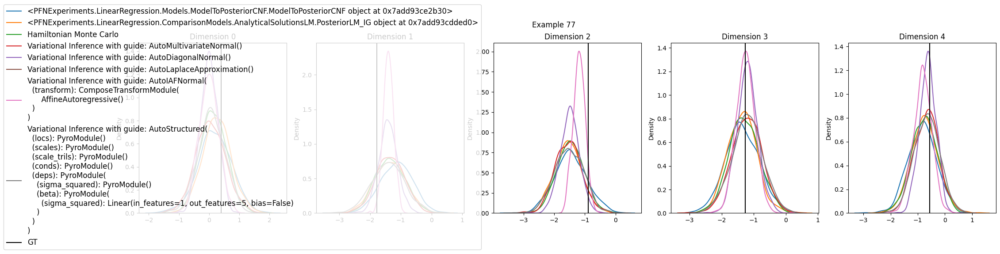

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

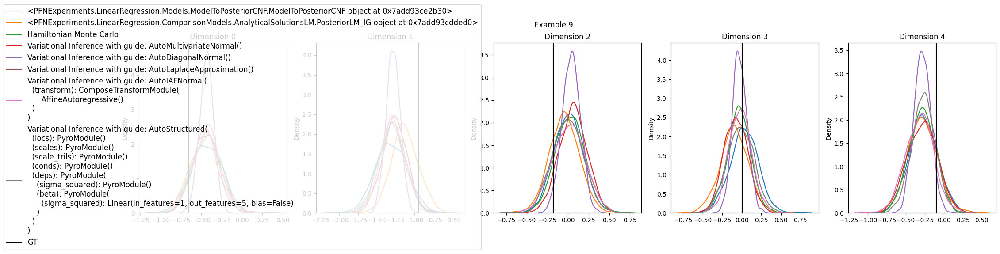

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

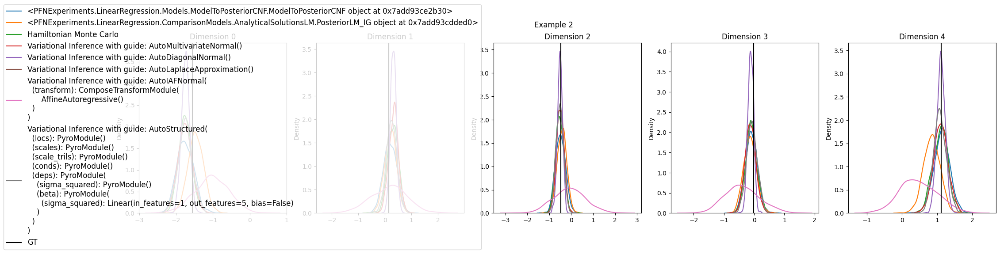

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

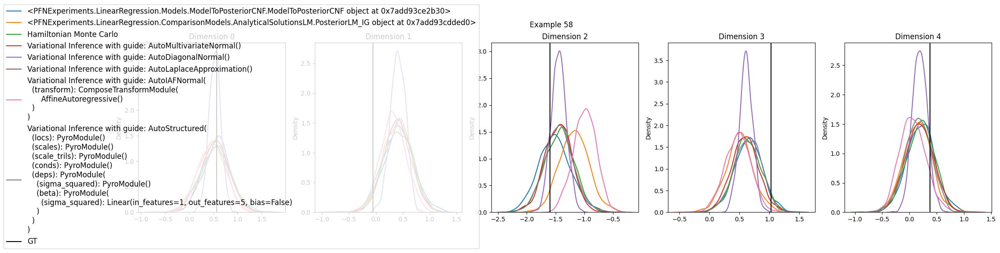

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

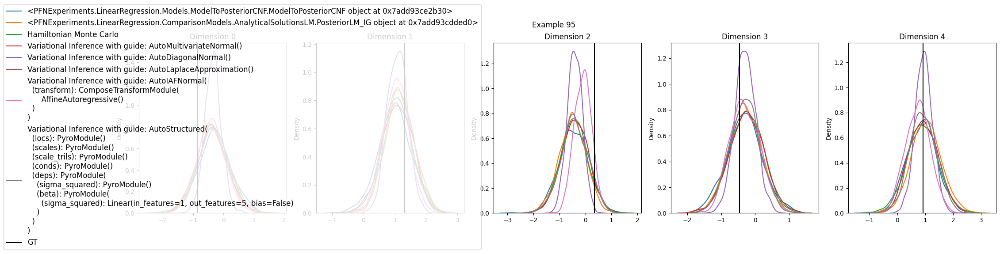

In [59]:
evaluation.plot_results()